In [1]:
import os
import torch
import torchvision
from torch.utils.data import DataLoader
from torchvision import transforms
import numpy as np
from torchvision.datasets import ImageFolder
from torch.utils.data import Dataset
import cv2

In [2]:
from PIL import Image  # Import PIL Image for handling image loading


data_dir='../input/gan-getting-started'
class GANdataGenerator(Dataset):
    def __init__(self,data_dir ,  data_files , image_size ):
        super(GANdataGenerator , self).__init__()
        self.data_dir = data_dir
        self.data = data_files
        self.transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize(image_size),
            transforms.CenterCrop(image_size),
            transforms.ToTensor()
        ])
        
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, index):
        data_file = self.data[index]
        data_file_path = os.path.join(self.data_dir, data_file)

        # Check if the file can be loaded
        img_bgr = cv2.imread(data_file_path)
        if img_bgr is None:
            print(f"Warning: Unable to load image at path {data_file_path}")
            return None  # You can also choose to raise an error here if needed
        
        # Proceed with color conversion and transformation
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        img_tensor = self.transform(img_rgb)
        
        return img_tensor

In [3]:
monet_jpg = os.listdir('/kaggle/input/person-face-sketches/train/sketches')
photo_jpg = os.listdir('/kaggle/input/person-face-sketches/train/photos')

X_type = 'photo_jpg'
Y_type = 'monet_jpg'

X_set = GANdataGenerator(data_dir='/kaggle/input/person-face-sketches/train/photos', data_files=photo_jpg, image_size=128)
Y_set = GANdataGenerator(data_dir='/kaggle/input/person-face-sketches/train/sketches', data_files=monet_jpg, image_size=128)

X_dataloader = DataLoader(X_set, batch_size=16, shuffle=True, num_workers=0)
Y_dataloader = DataLoader(Y_set, batch_size=16, shuffle=True, num_workers=0)


In [4]:
x_data = next(iter(X_dataloader))
y_data = next(iter(Y_dataloader))

X Data Visualization


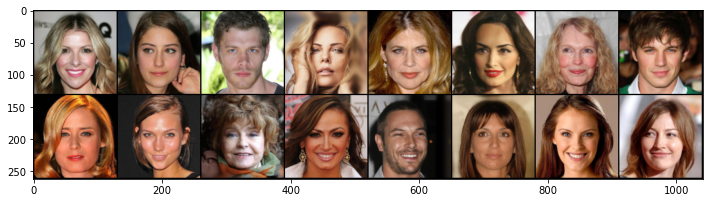

In [5]:
import matplotlib.pyplot as plt
print("X Data Visualization")
def imshow(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
fig = plt.figure(figsize=(12, 8))
imshow(torchvision.utils.make_grid(x_data))

Y Data Visualization


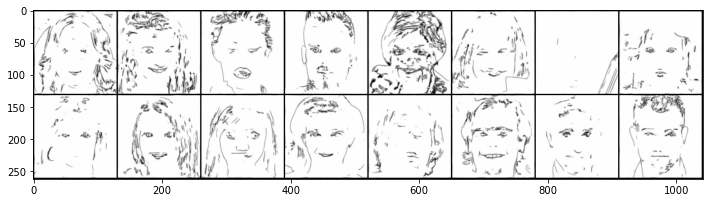

In [6]:
import matplotlib.pyplot as plt
print("Y Data Visualization")
def imshow(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
fig = plt.figure(figsize=(12, 8))
imshow(torchvision.utils.make_grid(y_data))

In [7]:
import matplotlib.pyplot as plt
def viz_sample(samples_x , samples_y):
    #get random sample from the x and y
    #plot the sample
    plt.title("Real sample")
    plt.imshow(samples_x)
    plt.show()
    plt.title("Fake sample")
    plt.imshow(samples_y)
    plt.show()

In [8]:
# Pre-processing: scaling from -1 to 1¶
# We need to do a bit of pre-processing; we know that the output of our tanh activated 
# generator will contain pixel values in a range from -1 to 1, and so, we need to rescale 
# our training images to a range of -1 to 1. (Right now, they are in a range from 0-

img = x_data[0]

print("Min : ",img.min())
print("Max : ",img.max())

def rescale(x , feature_range=(-1,1)):
    min , max = feature_range
    x = x*(max - min) +min
    
    return x

Min :  tensor(0.0039)
Max :  tensor(0.9765)


In [9]:
# scaled range
scaled_img = rescale(img)

print('Scaled min: ', scaled_img.min())
print('Scaled max: ', scaled_img.max())

Scaled min:  tensor(-0.9922)
Scaled max:  tensor(0.9529)


In [10]:
import torch.nn as nn
import torch.nn.functional as F

#define the conv block for discriminator
def conv_block(in_channels , out_channels , kernel_size=4 , strides=2 ,padding_type='reflect' , padding=1 , batch_norm=True):
    layers = []
    if(padding_type=='reflect'):
        pad = nn.ReflectionPad2d(padding)
        layers.append(pad)
        
    if(padding_type=='replicate'):
        pad = nn.ReplicationPad2d(padding)
        layers.append(pad)
        
        
    conv_layer = nn.Conv2d(in_channels=in_channels , out_channels=out_channels , 
                          kernel_size=kernel_size , stride=strides , padding=0 ,  bias=False)
    layers.append(conv_layer)
    if(batch_norm):
        bn = nn.InstanceNorm2d(out_channels)
        layers.append(bn)
        
    return nn.Sequential(*layers)

In [11]:
class Discriminator(nn.Module):
    
    def __init__(self , conv_dim , padding_mode):
        super(Discriminator , self).__init__()
        """
        Define the discriminator model to classify the images as real or fake
        in_channels =3
        out_channels=1
        """
        self.input_channels = 3
        self.output_channels = 1
        self.padding_mode = padding_mode
        # 256 - 256 -3 --> 128 - 128 -64
        self.conv_block1 = conv_block(self.input_channels , conv_dim  , padding_type=padding_mode)
        # 128 - 128 - 64 --> 64 - 64 - 128
        self.conv_block2 = conv_block(conv_dim , conv_dim*2 , padding_type=padding_mode)
        # 64 - 64 - 128 --> 32 - 32 - 256
        self.conv_block3 = conv_block(conv_dim*2 , conv_dim*4 , padding_type=padding_mode )
        # 32 - 32 - 256 --> 16 - 16 - 512
        self.conv_block4 = conv_block(conv_dim*4 , conv_dim*8 , padding_type=padding_mode)
        # 16 - 16 - 512 --> 8 - 8 - 1024
        self.conv_block5 = conv_block(conv_dim*8 , self.output_channels , kernel_size=1 ,
                                      strides=1 ,padding_type=None ,  padding=0 , batch_norm=False)
        self.leaky_relu = nn.LeakyReLU(negative_slope=0.2, inplace=True)
        
    def forward(self , x):
        x = self.leaky_relu(self.conv_block1(x))
        x = self.leaky_relu(self.conv_block2(x))
        x = self.leaky_relu(self.conv_block3(x))
        x = self.leaky_relu(self.conv_block4(x))
        
        out = self.conv_block5(x)
        
        return out
        

In [12]:
#define the discriminator network with encoder - resblock - decoder
class ResidualBlock(nn.Module):
    """
    apply two conv layers with Batchnormalization and relu activation on first block
    """
    def __init__(self , conv_dim , padding_mode):
        super(ResidualBlock , self).__init__()
        self.conv_dim = conv_dim
        self.conv_block1 = conv_block(self.conv_dim , self.conv_dim , kernel_size=3 ,
                                      strides=1 ,padding_type=padding_mode , padding=1 , batch_norm=True)
        
        self.conv_block2 = conv_block(self.conv_dim , self.conv_dim , kernel_size=3 ,
                                      strides=1 ,padding_type=padding_mode, padding=1 , batch_norm=True)
        
        self.dropout = nn.Dropout(p=0.3)
        self.relu = nn.ReLU(inplace=True)
        
    def forward(self , x):
        res_1 = self.dropout(self.relu(self.conv_block1(x)))
        res_2 = self.conv_block2(res_1)
        out  = self.relu(res_2 + x)
        
        return out

In [13]:
def deconv_block(in_channels , out_channels , kernel_size=4 , strides=2 , padding=1 , batch_norm=True):
    layers = []        
    deconv_layer = nn.ConvTranspose2d(in_channels=in_channels , out_channels=out_channels ,
                                      kernel_size=kernel_size , stride=strides , padding=padding , bias=False)
    layers.append(deconv_layer)
    if(batch_norm):
        bn = nn.InstanceNorm2d(out_channels)
        layers.append(bn)
        
    return nn.Sequential(*layers)

In [14]:
class CycleGenerator(nn.Module):
    def __init__(self , conv_dim , n_resblocks , padding_mode):
        super(CycleGenerator , self).__init__()
        self.conv_dim = conv_dim
        self.n_resblocks = n_resblocks
        self.in_channels = 3
        self.out_channels = 3
        self.encoder = nn.Sequential(
            conv_block(self.in_channels , conv_dim , padding_type=padding_mode) ,
            nn.ReLU(True),
            conv_block(conv_dim , conv_dim*2 , padding_type=padding_mode), 
            nn.ReLU(True),
            conv_block(conv_dim*2 , conv_dim*4 , padding_type=padding_mode),
            nn.ReLU(True)
        )
        layers = []
        for i_res in range(self.n_resblocks):
            layers.append(ResidualBlock(conv_dim*4 , padding_mode=padding_mode))
        self.res_block = nn.Sequential(*layers)
        
        self.decoder =nn.Sequential(
            deconv_block(conv_dim*4 , conv_dim*2 ),
            nn.ReLU(True),
            deconv_block(conv_dim*2, conv_dim ),
            nn.ReLU(True),
            deconv_block(conv_dim , self.out_channels , batch_norm=False),
            nn.Tanh()
        )
    def forward(self, x):
        #inference throght the encoder
        x = self.encoder(x)
        x = self.res_block(x)
        x = self.decoder(x)
        
        return x

In [15]:
def weights_init_normal(m):
    classname = m.__class__.__name__
    if(classname.find('Conv') != -1):
        torch.nn.init.normal(m.weight.data , 0.0 , 0.02)
    elif(classname.find('Batchnorm2d')!= -1):
        torch.nn.init.normal(m.weight.data , 0.0 , 0.02)
        torch.nn.init.constant(m.bias.data , 0.0)

In [20]:
def load_weights_if_available(model, model_name, checkpoint_dir='/kaggle/working/cyclegan_weights'):
    """Loads weights from a checkpoint if the file exists."""
    model_path = os.path.join(checkpoint_dir, f'{model_name}.pth')
    if os.path.exists(model_path):
        print(f"Loading {model_name} weights from {model_path}")
        model.load_state_dict(torch.load(model_path))
    else:
        print(f"No checkpoint found for {model_name}, starting with random weights.")
    return model

def create_model(g_conv_dim=64, d_conv_dim=64, n_resblocks=9, padding_mode='reflect', checkpoint_dir='/kaggle/input/cyclegan_weights/pytorch/default/1'):
    G_X2Y = CycleGenerator(g_conv_dim, n_resblocks, padding_mode)
    G_Y2X = CycleGenerator(g_conv_dim, n_resblocks, padding_mode)
    D_X = Discriminator(d_conv_dim, padding_mode)
    D_Y = Discriminator(d_conv_dim, padding_mode)
    
    # Initialize the weights
    G_X2Y.apply(weights_init_normal)
    G_Y2X.apply(weights_init_normal)
    D_X.apply(weights_init_normal)
    D_Y.apply(weights_init_normal)
    
    # Load pretrained weights if available
    G_X2Y = load_weights_if_available(G_X2Y, 'G_X2Y', checkpoint_dir)
    G_Y2X = load_weights_if_available(G_Y2X, 'Y2X', checkpoint_dir)
    D_X = load_weights_if_available(D_X, 'D_X', checkpoint_dir)
    D_Y = load_weights_if_available(D_Y, 'D_Y', checkpoint_dir)
    
    # Move the models to GPU if available
    device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
    G_X2Y.to(device)
    G_Y2X.to(device)
    D_X.to(device)
    D_Y.to(device)
    
    return G_X2Y, G_Y2X, D_X, D_Y


In [21]:
G_X2Y , G_Y2X , D_X , D_Y = create_model(padding_mode='replicate')

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: nn.init.normal is now deprecated in favor of nn.init.normal_.
  after removing the cwd from sys.path.


Loading G_X2Y weights from /kaggle/input/cyclegan_weights/pytorch/default/1/G_X2Y.pth
Loading Y2X weights from /kaggle/input/cyclegan_weights/pytorch/default/1/Y2X.pth
Loading D_X weights from /kaggle/input/cyclegan_weights/pytorch/default/1/D_X.pth
Loading D_Y weights from /kaggle/input/cyclegan_weights/pytorch/default/1/D_Y.pth


In [22]:
criterion_Idt = nn.L1Loss()
#define loss functions which are helpful
def real_mse_loss(D_out):
    # how close is the produced output from being "real"?
    return torch.mean((D_out -1)**2)

def fake_mse_loss(D_out):
    # how close is the produced output from being "false"?
    return torch.mean(D_out**2)
    

def cycle_consistency_loss(real_im, reconstructed_im, lambda_weight):
    # calculate reconstruction loss 
    # return weighted loss
    reconstruct_loss = torch.mean(torch.abs(real_im-reconstructed_im))
    return reconstruct_loss*lambda_weight

def identity_loss(lambda_idt , idt_B ,real_B , idt_A , real_A , lambda_weight):
    
    if lambda_idt > 0:
        # G_A should be identity if real_B is fed: ||G_A(B) - B||
        loss_idt_A = criterion_Idt(idt_B, real_B) * lambda_weight * lambda_idt
        # G_B should be identity if real_A is fed: ||G_B(A) - A||
        loss_idt_B = criterion_Idt(idt_A, real_A) * lambda_weight * lambda_idt
    else:
        self.loss_idt_A = 0
        self.loss_idt_B = 0
        
    return loss_idt_A + loss_idt_B

In [23]:
#define the optimizers
import torch.optim as optim
from torch.optim.lr_scheduler import MultiStepLR

# hyperparams for Adam optimizers
lr=0.0002
beta1=0.5
beta2= 0.999

g_params = list(G_X2Y.parameters()) + list(G_Y2X.parameters())  # Get generator parameters

# Create optimizers for the generators and discriminators
g_optimizer   = optim.Adam(g_params, lr, [beta1, beta2])
d_x_optimizer = optim.Adam(D_X.parameters(), lr, [beta1, beta2])
d_y_optimizer = optim.Adam(D_Y.parameters(), lr, [beta1, beta2])

lambda1 = 3500
lambda2 = 8500

#define lr scheduler
#g_lr_scheduler = MultiStepLR(g_optimizer, milestones=[lambda1,lambda2], gamma=0.1)
#dx_lr_scheduler =MultiStepLR(d_x_optimizer, milestones=[lambda1,lambda2], gamma=0.1)
#dy_lr_scheduler = MultiStepLR(d_y_optimizer, milestones=[lambda1,lambda2], gamma=0.1)

In [30]:
def imshow_tensor(img_tensor):
    """Converts a tensor into a NumPy array and displays it as an image."""
    img_tensor = img_tensor.detach().cpu()  # Detach from computation graph and move to CPU if on GPU
    img_np = img_tensor.numpy()  # Convert to NumPy array
    img_np = (img_np + 1) / 2  # Rescale from [-1, 1] to [0, 1]
    img_np = img_np.transpose(1, 2, 0)  # Change shape from (C, H, W) to (H, W, C)
    return img_np
  

    
import matplotlib.pyplot as plt

def visualize_epoch_samples(epoch, real_X, Gx_fake, Gy_fake_re, Gy_fake, Gx_fake_re):
    """
    Displays the real image, generated image, and reconstructed images side by side 
    for both directions (X -> Y and Y -> X) in a single row.
    """

    # Create a figure with 6 subplots for Real, Generated, and Reconstructed images
    fig, axes = plt.subplots(1, 6, figsize=(18, 4))  # 1 row, 6 columns for images

    # Display Real image (X domain)
    real_X_img = imshow_tensor(real_X[0])
    axes[0].imshow(real_X_img)
    axes[0].axis('off')  # Hide axes
    axes[0].set_title('Real (X)')

    # Display Generated image (Y domain)
    Gx_fake_img = imshow_tensor(Gx_fake[0])
    axes[1].imshow(Gx_fake_img)
    axes[1].axis('off')  # Hide axes
    axes[1].set_title('Generated (Y)')

    # Display Reconstructed image (X domain)
    Gy_fake_re_img = imshow_tensor(Gy_fake_re[0])
    axes[2].imshow(Gy_fake_re_img)
    axes[2].axis('off')  # Hide axes
    axes[2].set_title('Reconstructed (X)')

    # Display Real image (Y domain)
    real_Y_img = imshow_tensor(Gy_fake[0])
    axes[3].imshow(real_Y_img)
    axes[3].axis('off')  # Hide axes
    axes[3].set_title('Real (Y)')

    # Display Generated image (X domain)
    Gy_fake_img = imshow_tensor(Gx_fake_re[0])
    axes[4].imshow(Gy_fake_img)
    axes[4].axis('off')  # Hide axes
    axes[4].set_title('Generated (X)')

    # Display Reconstructed image (Y domain)
    Gx_fake_re_img = imshow_tensor(Gx_fake_re[0])
    axes[5].imshow(Gx_fake_re_img)
    axes[5].axis('off')  # Hide axes
    axes[5].set_title('Reconstructed (Y)')

    # Add an overall title for the figure
    fig.suptitle(f'Epoch {epoch}: Real, Generated, and Reconstructed', fontsize=16)

    # Show the plot
    plt.show()



def save_checkpoint(epoch, G_X2Y, G_Y2X, D_X, D_Y, checkpoint_dir='checkpoints'):
  
    # Save generator models
    torch.save(G_X2Y.state_dict(), f'G_X2Y.pth')
    torch.save(G_Y2X.state_dict(), f'Y2X.pth')
    
    # Save discriminator models
    torch.save(D_X.state_dict(), f'D_X.pth')
    torch.save(D_Y.state_dict(), f'D_Y.pth')

    print(f"Checkpoint saved at epoch {epoch}")
    
# Assuming Gx_fake is of shape [batch_size, 3, H, W]
# Select the first image in the batch (if there are multiple images in the batch)


# train the network
def training_loop(dataloader_X, dataloader_Y, test_dataloader_X , test_dataloader_Y, n_epochs=10000):
    
    print_every=1
    checkpoint_every=10
    # keep track of losses over time
    losses = []

    test_iter_X = iter(dataloader_X)
    test_iter_Y = iter(dataloader_Y)

    # Get some fixed data from domains X and Y for sampling. These are images that are held
    # constant throughout training, that allow us to inspect the model's performance.
    fixed_X = test_iter_X.next()[0]
    fixed_Y = test_iter_Y.next()[0]
    fixed_X = rescale(fixed_X) # make sure to scale to a range -1 to 1
    fixed_Y = rescale(fixed_Y)

    # batches per epoch
    iter_X = iter(dataloader_X)
    iter_Y = iter(dataloader_Y)
    batches_per_epoch = min(len(iter_X), len(iter_Y))

    for epoch in range(1, n_epochs+1):
        
        
#         # Inside the training loop
#         if epoch % 2 == 0:  # Visualize every 10 epochs
#             visualize_samples(epoch, fixed_X[0], fixed_Y[0], G_Y2X, G_X2Y, device)

        # Reset iterators for each epoch
        if epoch % batches_per_epoch == 0:
            iter_X = iter(dataloader_X)
            iter_Y = iter(dataloader_Y)

        images_X = iter_X.next()
        images_X = rescale(images_X) # make sure to scale to a range -1 to 1

        images_Y = iter_Y.next()
        images_Y = rescale(images_Y)
        
        # move images to GPU if available (otherwise stay on CPU)
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        images_X = images_X.to(device)
        images_Y = images_Y.to(device)


        # ============================================
        #            TRAIN THE DISCRIMINATORS
        # ============================================

        ##   First: D_X, real and fake loss components   ##

        # 1. Compute the discriminator losses on real images in X domain
        Dx_real_out = D_X(images_X)
        Dx_real_loss = real_mse_loss(Dx_real_out)
        
        # 2. Generate fake images that look like domain X based on real images in domain Y
        Gx_fake = G_Y2X(images_Y)

        # 3. Compute the fake loss for D_X on fake X
        Dx_fake_out= D_X(Gx_fake)
        Dx_fake_loss = fake_mse_loss(Dx_fake_out)
        
        # 4. Compute the total loss and perform backprop
        d_x_loss = Dx_real_loss + Dx_fake_loss
        #reste the optimizer
        d_x_optimizer.zero_grad()
        #backprop the loss
        d_x_loss.backward()
        #optimze the descrimintaer x
        d_x_optimizer.step()

        
        ##   Second: D_Y, real and fake loss components   ##
        Dy_real_out = D_Y(images_Y)
        Dy_real_loss = real_mse_loss(Dy_real_out)
        
        #generate fake images looks like the domain y on the real images in domain x
        Gy_fake = G_X2Y(images_X)
        
        #compute the descreminter fake loss
        Dy_fake_out = D_Y(Gy_fake)
        Dy_fake_loss = fake_mse_loss(Dy_fake_out)
        
        d_y_loss = Dy_fake_loss + Dy_real_loss
        #reset the optimizer
        d_y_optimizer.zero_grad()
        #backprop the loss
        d_y_loss.backward()
        #optimize the model
        d_y_optimizer.step()
        


        # =========================================
        #            TRAIN THE GENERATORS
        # =========================================

        ##    First: generate fake X images and reconstructed Y images    ##

        # 1. Generate fake images that look like domain X based on real images in domain Y
        Gx_fake = G_Y2X(images_Y)

        # 2. Compute the generator loss based on domain X
        Dx_fake_out = D_X(Gx_fake)
        Gx_fake_loss = real_mse_loss(Dx_fake_out)

        # 3. Create a reconstructed y
        Gy_fake_re =  G_X2Y(Gx_fake) 
        
        # 4. Compute the cycle consistency loss (the reconstruction loss)
        Gy_reconstruct_loss = cycle_consistency_loss(images_Y , Gy_fake_re , lambda_weight=10)

        ##    Second: generate fake Y images and reconstructed X images    ##
        Gy_fake = G_X2Y(images_X)
        
        #compute the generator fake loss on descriminator
        Dy_fake_out = D_Y(Gy_fake)
        Gy_fake_loss = real_mse_loss(Dy_fake_out)
        
        #regenerate the x images from fake y domain images
        Gx_fake_re = G_Y2X(Gy_fake)
        
        #compute the cycle consistnace loss on the real x and reconstructed x images
        Gx_reconstuct_loss = cycle_consistency_loss(images_X , Gx_fake_re , lambda_weight=10)
        
        #compute the identity loss
        idt_B = G_X2Y(images_Y)
        idt_A = G_Y2X(images_X)
        id_loss = identity_loss(0.1 , idt_B , images_Y ,
                                idt_A , images_X , lambda_weight=8)

        # 5. Add up all generator and reconstructed losses and perform backprop
        g_total_loss = Gx_fake_loss + Gy_fake_loss + Gy_reconstruct_loss + Gx_reconstuct_loss + id_loss
        
        #optimize the generator model
        g_optimizer.zero_grad()
        #back prop the loss
        g_total_loss.backward()
        #optimize the generator model
        g_optimizer.step()

        
        # Print the log info
        if epoch % print_every == 0:
            # append real and fake discriminator losses and the generator loss
            losses.append((d_x_loss.item(), d_y_loss.item(), g_total_loss.item()))
            print('Epoch [{:5d}/{:5d}] | d_X_loss: {:6.4f} | d_Y_loss: {:6.4f} | g_total_loss: {:6.4f}'.format(
                    epoch, n_epochs, d_x_loss.item(), d_y_loss.item(), g_total_loss.item()))

            
            
            
        if epoch % 30 == 0:
            visualize_epoch_samples(epoch, images_X, Gx_fake, Gy_fake_re, Gy_fake, Gx_fake_re)

            
         # Save model checkpoints
        if epoch % 10 == 0:
            save_checkpoint(epoch, G_X2Y, G_Y2X, D_X, D_Y)
            
            
        sample_every=1000
        # Save the generated samples
        if epoch % sample_every == 0:
            G_Y2X.eval() # set generators to eval mode for sample generation
            G_X2Y.eval()
            save_samples(epoch, fixed_Y, fixed_X, G_Y2X, G_X2Y, batch_size=16)
            G_Y2X.train()
            G_X2Y.train()
        
        #g_lr_scheduler.step()
        #dx_lr_scheduler.step()
        #dy_lr_scheduler.step()
        # uncomment these lines, if you want to save your model
#         checkpoint_every=1000
#         # Save the model parameters
        #if epoch % checkpoint_every == 0:
            #checkpoint(epoch, G_XtoY, G_YtoX, D_X, D_Y)

    return losses


## Helper functions

In [31]:
# helper functions for saving sample data and models

# import data loading libraries
import os
import pdb
import pickle
import argparse

import warnings
warnings.filterwarnings("ignore")

# import torch
import torch


# numpy & scipy imports
import numpy as np
import scipy
import scipy.misc


def checkpoint(iteration, G_XtoY, G_YtoX, D_X, D_Y, checkpoint_dir='checkpoints_cyclegan'):
    """Saves the parameters of both generators G_YtoX, G_XtoY and discriminators D_X, D_Y.
        """
    G_XtoY_path = os.path.join(checkpoint_dir, 'G_XtoY.pkl')
    G_YtoX_path = os.path.join(checkpoint_dir, 'G_YtoX.pkl')
    D_X_path = os.path.join(checkpoint_dir, 'D_X.pkl')
    D_Y_path = os.path.join(checkpoint_dir, 'D_Y.pkl')
    torch.save(G_XtoY.state_dict(), G_XtoY_path)
    torch.save(G_YtoX.state_dict(), G_YtoX_path)
    torch.save(D_X.state_dict(), D_X_path)
    torch.save(D_Y.state_dict(), D_Y_path)


def merge_images(sources, targets, batch_size=16):
    """Creates a grid consisting of pairs of columns, where the first column in
        each pair contains images source images and the second column in each pair
        contains images generated by the CycleGAN from the corresponding images in
        the first column.
        """
    _, _, h, w = sources.shape
    row = int(np.sqrt(batch_size))
    merged = np.zeros([3, row*h, row*w*2])
    for idx, (s, t) in enumerate(zip(sources, targets)):
        i = idx // row
        j = idx % row
        merged[:, i*h:(i+1)*h, (j*2)*h:(j*2+1)*h] = s
        merged[:, i*h:(i+1)*h, (j*2+1)*h:(j*2+2)*h] = t
    merged = merged.transpose(1, 2, 0)
    return merged
    

def to_data(x):
    """Converts variable to numpy."""
    if torch.cuda.is_available():
        x = x.cpu()
    x = x.squeeze(0)
    x = x.data.numpy()
    x = np.transpose(x,(1,2,0))
    x = ((x +1)*255 / (2)).astype(np.uint8) # rescale to 0-255
    return x

def save_samples(iteration, fixed_Y, fixed_X, G_YtoX, G_XtoY, batch_size=16, sample_dir='samples_cyclegan'):
    """Saves samples from both generators X->Y and Y->X.
        """
    # move input data to correct device
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    fake_X = G_YtoX(fixed_Y.unsqueeze(0).to(device))
    fake_Y = G_XtoY(fixed_X.unsqueeze(0).to(device))
    
    X, fake_X = to_data(fixed_X), to_data(fake_X)
    Y, fake_Y = to_data(fixed_Y), to_data(fake_Y)
    
    #merged = merge_images(X, fake_Y, batch_size)
    #path = os.path.join(sample_dir, 'sample-{:06d}-X-Y.png'.format(iteration))
    #scipy.misc.imsave(path, merged)
    #print('Saved {}'.format(path))
    viz_sample(X,fake_Y)
    #viz_sample(Y,fake_X)
    #return fake_Y
    

Epoch [    1/ 1000] | d_X_loss: 0.4523 | d_Y_loss: 0.1623 | g_total_loss: 3.8452
Epoch [    2/ 1000] | d_X_loss: 0.4274 | d_Y_loss: 0.1704 | g_total_loss: 3.8891
Epoch [    3/ 1000] | d_X_loss: 0.4144 | d_Y_loss: 0.1948 | g_total_loss: 3.5254
Epoch [    4/ 1000] | d_X_loss: 0.4286 | d_Y_loss: 0.1646 | g_total_loss: 3.8756
Epoch [    5/ 1000] | d_X_loss: 0.4153 | d_Y_loss: 0.2027 | g_total_loss: 3.7304
Epoch [    6/ 1000] | d_X_loss: 0.4105 | d_Y_loss: 0.2488 | g_total_loss: 3.6655
Epoch [    7/ 1000] | d_X_loss: 0.4038 | d_Y_loss: 0.1693 | g_total_loss: 4.0055
Epoch [    8/ 1000] | d_X_loss: 0.4104 | d_Y_loss: 0.1435 | g_total_loss: 3.5136
Epoch [    9/ 1000] | d_X_loss: 0.4258 | d_Y_loss: 0.2288 | g_total_loss: 3.9594
Epoch [   10/ 1000] | d_X_loss: 0.4672 | d_Y_loss: 0.5704 | g_total_loss: 3.4458
Checkpoint saved at epoch 10
Epoch [   11/ 1000] | d_X_loss: 0.4626 | d_Y_loss: 0.1579 | g_total_loss: 3.4399
Epoch [   12/ 1000] | d_X_loss: 0.4292 | d_Y_loss: 0.2904 | g_total_loss: 3.3795

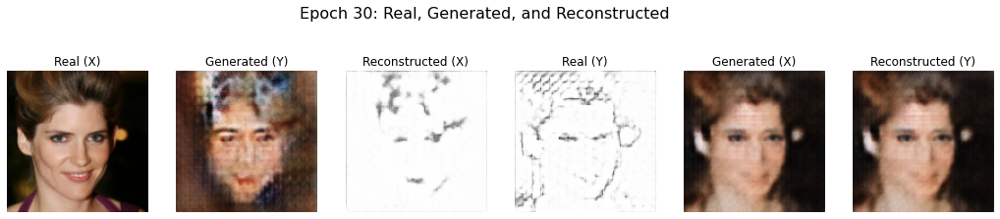

Checkpoint saved at epoch 30
Epoch [   31/ 1000] | d_X_loss: 0.4298 | d_Y_loss: 0.2422 | g_total_loss: 4.3674
Epoch [   32/ 1000] | d_X_loss: 0.4362 | d_Y_loss: 0.4924 | g_total_loss: 3.1515
Epoch [   33/ 1000] | d_X_loss: 0.4552 | d_Y_loss: 0.6312 | g_total_loss: 3.5858
Epoch [   34/ 1000] | d_X_loss: 0.4350 | d_Y_loss: 0.6171 | g_total_loss: 4.3373
Epoch [   35/ 1000] | d_X_loss: 0.3935 | d_Y_loss: 0.7669 | g_total_loss: 4.1645
Epoch [   36/ 1000] | d_X_loss: 0.3778 | d_Y_loss: 0.3919 | g_total_loss: 3.8875
Epoch [   37/ 1000] | d_X_loss: 0.4186 | d_Y_loss: 0.2899 | g_total_loss: 4.0665
Epoch [   38/ 1000] | d_X_loss: 0.3675 | d_Y_loss: 0.3107 | g_total_loss: 4.3063
Epoch [   39/ 1000] | d_X_loss: 0.3997 | d_Y_loss: 0.2905 | g_total_loss: 4.1044
Epoch [   40/ 1000] | d_X_loss: 0.3900 | d_Y_loss: 0.1896 | g_total_loss: 3.8696
Checkpoint saved at epoch 40
Epoch [   41/ 1000] | d_X_loss: 0.4117 | d_Y_loss: 0.1755 | g_total_loss: 4.0570
Epoch [   42/ 1000] | d_X_loss: 0.3808 | d_Y_loss: 

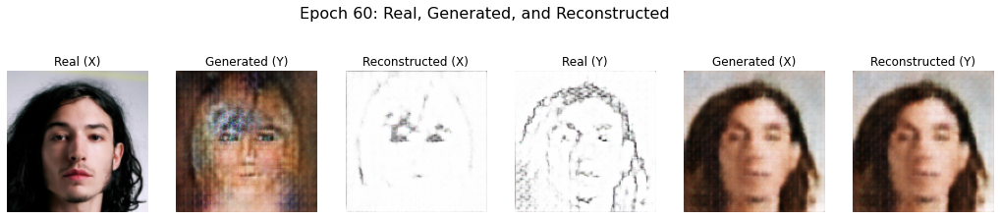

Checkpoint saved at epoch 60
Epoch [   61/ 1000] | d_X_loss: 0.4282 | d_Y_loss: 0.1783 | g_total_loss: 4.8983
Epoch [   62/ 1000] | d_X_loss: 0.3856 | d_Y_loss: 0.1930 | g_total_loss: 3.6405
Epoch [   63/ 1000] | d_X_loss: 0.4035 | d_Y_loss: 0.2174 | g_total_loss: 3.7705
Epoch [   64/ 1000] | d_X_loss: 0.4278 | d_Y_loss: 0.2095 | g_total_loss: 3.8340
Epoch [   65/ 1000] | d_X_loss: 0.4225 | d_Y_loss: 0.2171 | g_total_loss: 3.8728
Epoch [   66/ 1000] | d_X_loss: 0.4193 | d_Y_loss: 0.2039 | g_total_loss: 3.8544
Epoch [   67/ 1000] | d_X_loss: 0.4103 | d_Y_loss: 0.1964 | g_total_loss: 3.9449
Epoch [   68/ 1000] | d_X_loss: 0.4067 | d_Y_loss: 0.2182 | g_total_loss: 4.0255
Epoch [   69/ 1000] | d_X_loss: 0.4107 | d_Y_loss: 0.2309 | g_total_loss: 3.8442
Epoch [   70/ 1000] | d_X_loss: 0.4461 | d_Y_loss: 0.2086 | g_total_loss: 3.4013
Checkpoint saved at epoch 70
Epoch [   71/ 1000] | d_X_loss: 0.4067 | d_Y_loss: 0.1883 | g_total_loss: 3.9413
Epoch [   72/ 1000] | d_X_loss: 0.4160 | d_Y_loss: 

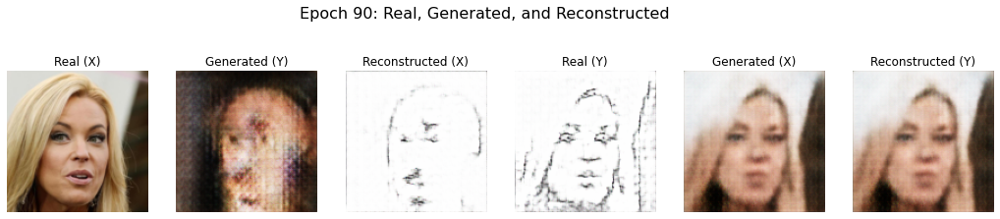

Checkpoint saved at epoch 90
Epoch [   91/ 1000] | d_X_loss: 0.3963 | d_Y_loss: 0.2362 | g_total_loss: 3.2643
Epoch [   92/ 1000] | d_X_loss: 0.4396 | d_Y_loss: 0.2097 | g_total_loss: 4.0996
Epoch [   93/ 1000] | d_X_loss: 0.4124 | d_Y_loss: 0.2348 | g_total_loss: 3.7010
Epoch [   94/ 1000] | d_X_loss: 0.4182 | d_Y_loss: 0.2390 | g_total_loss: 4.3767
Epoch [   95/ 1000] | d_X_loss: 0.4082 | d_Y_loss: 0.3469 | g_total_loss: 3.6153
Epoch [   96/ 1000] | d_X_loss: 0.3868 | d_Y_loss: 0.4304 | g_total_loss: 3.7630
Epoch [   97/ 1000] | d_X_loss: 0.3835 | d_Y_loss: 0.3813 | g_total_loss: 4.2041
Epoch [   98/ 1000] | d_X_loss: 0.3525 | d_Y_loss: 0.2794 | g_total_loss: 3.9457
Epoch [   99/ 1000] | d_X_loss: 0.3693 | d_Y_loss: 0.2436 | g_total_loss: 4.0118
Epoch [  100/ 1000] | d_X_loss: 0.4551 | d_Y_loss: 0.2892 | g_total_loss: 4.2908
Checkpoint saved at epoch 100
Epoch [  101/ 1000] | d_X_loss: 0.4270 | d_Y_loss: 0.3611 | g_total_loss: 3.9974
Epoch [  102/ 1000] | d_X_loss: 0.4037 | d_Y_loss:

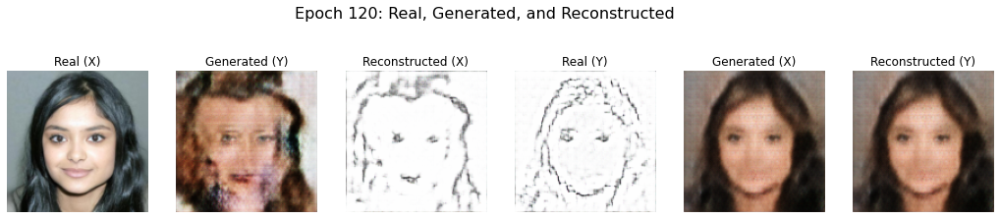

Checkpoint saved at epoch 120
Epoch [  121/ 1000] | d_X_loss: 0.3897 | d_Y_loss: 0.1683 | g_total_loss: 4.2930
Epoch [  122/ 1000] | d_X_loss: 0.3997 | d_Y_loss: 0.1838 | g_total_loss: 4.0689
Epoch [  123/ 1000] | d_X_loss: 0.4120 | d_Y_loss: 0.1788 | g_total_loss: 3.7194
Epoch [  124/ 1000] | d_X_loss: 0.4376 | d_Y_loss: 0.1750 | g_total_loss: 4.3563
Epoch [  125/ 1000] | d_X_loss: 0.4269 | d_Y_loss: 0.1980 | g_total_loss: 3.7920
Epoch [  126/ 1000] | d_X_loss: 0.4244 | d_Y_loss: 0.1863 | g_total_loss: 3.8185
Epoch [  127/ 1000] | d_X_loss: 0.4454 | d_Y_loss: 0.2168 | g_total_loss: 3.5659
Epoch [  128/ 1000] | d_X_loss: 0.4100 | d_Y_loss: 0.1744 | g_total_loss: 3.6211
Epoch [  129/ 1000] | d_X_loss: 0.4180 | d_Y_loss: 0.2088 | g_total_loss: 3.6949
Epoch [  130/ 1000] | d_X_loss: 0.3787 | d_Y_loss: 0.5403 | g_total_loss: 3.0358
Checkpoint saved at epoch 130
Epoch [  131/ 1000] | d_X_loss: 0.3852 | d_Y_loss: 0.4293 | g_total_loss: 3.4748
Epoch [  132/ 1000] | d_X_loss: 0.4169 | d_Y_loss

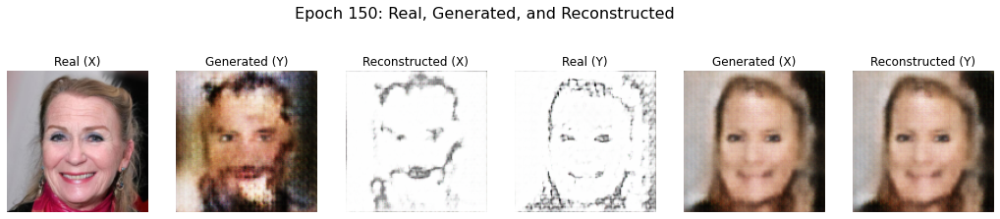

Checkpoint saved at epoch 150
Epoch [  151/ 1000] | d_X_loss: 0.4138 | d_Y_loss: 0.3132 | g_total_loss: 4.3277
Epoch [  152/ 1000] | d_X_loss: 0.3939 | d_Y_loss: 0.2951 | g_total_loss: 3.4629
Epoch [  153/ 1000] | d_X_loss: 0.4141 | d_Y_loss: 0.4229 | g_total_loss: 4.2893
Epoch [  154/ 1000] | d_X_loss: 0.4435 | d_Y_loss: 0.4773 | g_total_loss: 3.5860
Epoch [  155/ 1000] | d_X_loss: 0.4998 | d_Y_loss: 0.5076 | g_total_loss: 3.2399
Epoch [  156/ 1000] | d_X_loss: 0.4168 | d_Y_loss: 0.5248 | g_total_loss: 4.0274
Epoch [  157/ 1000] | d_X_loss: 0.4028 | d_Y_loss: 0.4661 | g_total_loss: 3.9824
Epoch [  158/ 1000] | d_X_loss: 0.3814 | d_Y_loss: 0.4005 | g_total_loss: 3.6903
Epoch [  159/ 1000] | d_X_loss: 0.4995 | d_Y_loss: 0.3541 | g_total_loss: 3.8120
Epoch [  160/ 1000] | d_X_loss: 0.4523 | d_Y_loss: 0.3517 | g_total_loss: 3.4213
Checkpoint saved at epoch 160
Epoch [  161/ 1000] | d_X_loss: 0.4754 | d_Y_loss: 0.3075 | g_total_loss: 3.9100
Epoch [  162/ 1000] | d_X_loss: 0.5047 | d_Y_loss

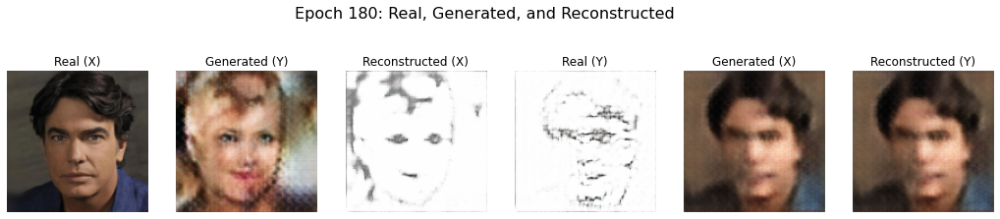

Checkpoint saved at epoch 180
Epoch [  181/ 1000] | d_X_loss: 0.3919 | d_Y_loss: 0.4201 | g_total_loss: 3.3310
Epoch [  182/ 1000] | d_X_loss: 0.3891 | d_Y_loss: 0.3144 | g_total_loss: 3.6056
Epoch [  183/ 1000] | d_X_loss: 0.3791 | d_Y_loss: 0.3906 | g_total_loss: 3.1229
Epoch [  184/ 1000] | d_X_loss: 0.3747 | d_Y_loss: 0.5765 | g_total_loss: 3.5860
Epoch [  185/ 1000] | d_X_loss: 0.3754 | d_Y_loss: 0.3529 | g_total_loss: 4.4056
Epoch [  186/ 1000] | d_X_loss: 0.4216 | d_Y_loss: 0.4632 | g_total_loss: 3.7822
Epoch [  187/ 1000] | d_X_loss: 0.3728 | d_Y_loss: 0.3238 | g_total_loss: 3.5361
Epoch [  188/ 1000] | d_X_loss: 0.3633 | d_Y_loss: 0.3871 | g_total_loss: 3.4538
Epoch [  189/ 1000] | d_X_loss: 0.3569 | d_Y_loss: 0.3647 | g_total_loss: 3.7968
Epoch [  190/ 1000] | d_X_loss: 0.3293 | d_Y_loss: 0.3729 | g_total_loss: 3.6833
Checkpoint saved at epoch 190
Epoch [  191/ 1000] | d_X_loss: 0.3361 | d_Y_loss: 0.3327 | g_total_loss: 3.6849
Epoch [  192/ 1000] | d_X_loss: 0.3880 | d_Y_loss

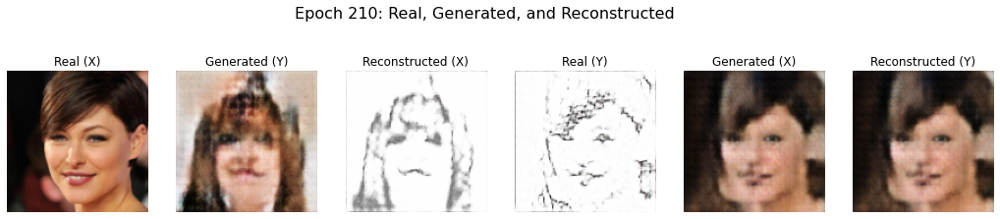

Checkpoint saved at epoch 210
Epoch [  211/ 1000] | d_X_loss: 0.3562 | d_Y_loss: 0.2624 | g_total_loss: 3.9393
Epoch [  212/ 1000] | d_X_loss: 0.3710 | d_Y_loss: 0.3071 | g_total_loss: 3.6532
Epoch [  213/ 1000] | d_X_loss: 0.4521 | d_Y_loss: 0.3317 | g_total_loss: 4.0000
Epoch [  214/ 1000] | d_X_loss: 0.3549 | d_Y_loss: 0.4066 | g_total_loss: 3.6898
Epoch [  215/ 1000] | d_X_loss: 0.4396 | d_Y_loss: 0.5060 | g_total_loss: 3.6708
Epoch [  216/ 1000] | d_X_loss: 0.4402 | d_Y_loss: 0.3818 | g_total_loss: 3.8897
Epoch [  217/ 1000] | d_X_loss: 0.5018 | d_Y_loss: 0.3902 | g_total_loss: 3.5467
Epoch [  218/ 1000] | d_X_loss: 0.5850 | d_Y_loss: 0.3362 | g_total_loss: 3.5358
Epoch [  219/ 1000] | d_X_loss: 0.7371 | d_Y_loss: 0.3282 | g_total_loss: 3.9321
Epoch [  220/ 1000] | d_X_loss: 0.6630 | d_Y_loss: 0.3578 | g_total_loss: 3.3983
Checkpoint saved at epoch 220
Epoch [  221/ 1000] | d_X_loss: 0.6649 | d_Y_loss: 0.2903 | g_total_loss: 3.6802
Epoch [  222/ 1000] | d_X_loss: 0.7402 | d_Y_loss

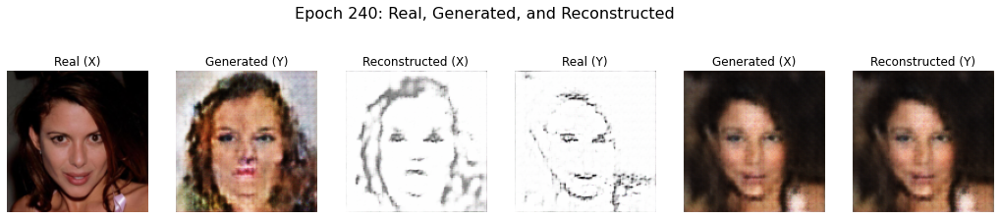

Checkpoint saved at epoch 240
Epoch [  241/ 1000] | d_X_loss: 0.4066 | d_Y_loss: 2.0692 | g_total_loss: 3.7833
Epoch [  242/ 1000] | d_X_loss: 0.3784 | d_Y_loss: 1.1810 | g_total_loss: 3.7150
Epoch [  243/ 1000] | d_X_loss: 0.3579 | d_Y_loss: 0.8816 | g_total_loss: 3.4229
Epoch [  244/ 1000] | d_X_loss: 0.3776 | d_Y_loss: 0.5112 | g_total_loss: 3.8170
Epoch [  245/ 1000] | d_X_loss: 0.3836 | d_Y_loss: 0.4914 | g_total_loss: 3.5980
Epoch [  246/ 1000] | d_X_loss: 0.3673 | d_Y_loss: 0.5003 | g_total_loss: 3.3152
Epoch [  247/ 1000] | d_X_loss: 0.3592 | d_Y_loss: 0.4789 | g_total_loss: 3.3012
Epoch [  248/ 1000] | d_X_loss: 0.3489 | d_Y_loss: 0.4250 | g_total_loss: 3.3091
Epoch [  249/ 1000] | d_X_loss: 0.3953 | d_Y_loss: 0.4340 | g_total_loss: 3.6843
Epoch [  250/ 1000] | d_X_loss: 0.4205 | d_Y_loss: 0.3714 | g_total_loss: 4.1111
Checkpoint saved at epoch 250
Epoch [  251/ 1000] | d_X_loss: 0.4248 | d_Y_loss: 0.3784 | g_total_loss: 3.8817
Epoch [  252/ 1000] | d_X_loss: 0.3936 | d_Y_loss

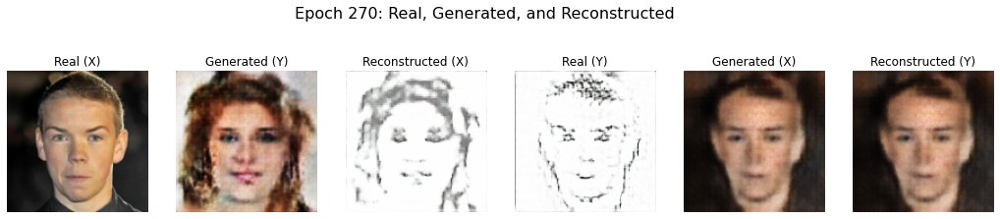

Checkpoint saved at epoch 270
Epoch [  271/ 1000] | d_X_loss: 0.3865 | d_Y_loss: 0.3759 | g_total_loss: 4.2924
Epoch [  272/ 1000] | d_X_loss: 0.3924 | d_Y_loss: 0.3182 | g_total_loss: 3.7443
Epoch [  273/ 1000] | d_X_loss: 0.3884 | d_Y_loss: 0.3999 | g_total_loss: 3.5383
Epoch [  274/ 1000] | d_X_loss: 0.4043 | d_Y_loss: 0.3220 | g_total_loss: 3.6142
Epoch [  275/ 1000] | d_X_loss: 0.4086 | d_Y_loss: 0.3321 | g_total_loss: 3.7439
Epoch [  276/ 1000] | d_X_loss: 0.4396 | d_Y_loss: 0.3118 | g_total_loss: 3.5606
Epoch [  277/ 1000] | d_X_loss: 0.4459 | d_Y_loss: 0.3101 | g_total_loss: 4.0315
Epoch [  278/ 1000] | d_X_loss: 0.4232 | d_Y_loss: 0.3375 | g_total_loss: 3.2368
Epoch [  279/ 1000] | d_X_loss: 0.4316 | d_Y_loss: 0.3627 | g_total_loss: 3.7309
Epoch [  280/ 1000] | d_X_loss: 0.4143 | d_Y_loss: 0.2611 | g_total_loss: 4.0258
Checkpoint saved at epoch 280
Epoch [  281/ 1000] | d_X_loss: 0.3959 | d_Y_loss: 0.3121 | g_total_loss: 3.5864
Epoch [  282/ 1000] | d_X_loss: 0.4005 | d_Y_loss

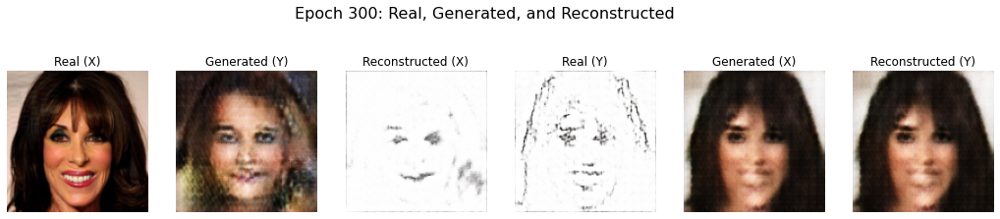

Checkpoint saved at epoch 300
Epoch [  301/ 1000] | d_X_loss: 0.3723 | d_Y_loss: 0.3720 | g_total_loss: 3.6093
Epoch [  302/ 1000] | d_X_loss: 0.3470 | d_Y_loss: 0.3271 | g_total_loss: 3.5307
Epoch [  303/ 1000] | d_X_loss: 0.3530 | d_Y_loss: 0.3368 | g_total_loss: 3.9516
Epoch [  304/ 1000] | d_X_loss: 0.4150 | d_Y_loss: 0.2749 | g_total_loss: 3.4780
Epoch [  305/ 1000] | d_X_loss: 0.3995 | d_Y_loss: 0.3239 | g_total_loss: 3.9876
Epoch [  306/ 1000] | d_X_loss: 0.4582 | d_Y_loss: 0.2769 | g_total_loss: 4.0107
Epoch [  307/ 1000] | d_X_loss: 0.4575 | d_Y_loss: 0.2966 | g_total_loss: 3.8384
Epoch [  308/ 1000] | d_X_loss: 0.4414 | d_Y_loss: 0.2819 | g_total_loss: 3.6738
Epoch [  309/ 1000] | d_X_loss: 0.4223 | d_Y_loss: 0.3939 | g_total_loss: 3.4196
Epoch [  310/ 1000] | d_X_loss: 0.3620 | d_Y_loss: 0.3434 | g_total_loss: 3.4376
Checkpoint saved at epoch 310
Epoch [  311/ 1000] | d_X_loss: 0.4054 | d_Y_loss: 0.2889 | g_total_loss: 3.4056
Epoch [  312/ 1000] | d_X_loss: 0.3711 | d_Y_loss

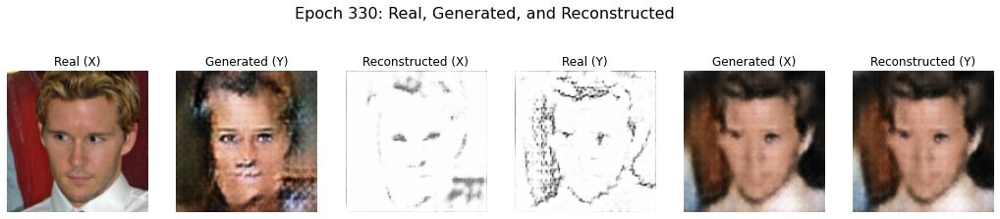

Checkpoint saved at epoch 330
Epoch [  331/ 1000] | d_X_loss: 0.3370 | d_Y_loss: 0.3940 | g_total_loss: 3.8162
Epoch [  332/ 1000] | d_X_loss: 0.3223 | d_Y_loss: 0.6115 | g_total_loss: 3.5188
Epoch [  333/ 1000] | d_X_loss: 0.3602 | d_Y_loss: 0.4503 | g_total_loss: 3.4041
Epoch [  334/ 1000] | d_X_loss: 0.3929 | d_Y_loss: 0.4392 | g_total_loss: 3.5560
Epoch [  335/ 1000] | d_X_loss: 0.3981 | d_Y_loss: 0.3220 | g_total_loss: 3.8573
Epoch [  336/ 1000] | d_X_loss: 0.4191 | d_Y_loss: 0.3859 | g_total_loss: 3.2166
Epoch [  337/ 1000] | d_X_loss: 0.4008 | d_Y_loss: 0.4328 | g_total_loss: 3.7010
Epoch [  338/ 1000] | d_X_loss: 0.4445 | d_Y_loss: 0.3234 | g_total_loss: 3.5997
Epoch [  339/ 1000] | d_X_loss: 0.3879 | d_Y_loss: 0.3772 | g_total_loss: 3.6103
Epoch [  340/ 1000] | d_X_loss: 0.3879 | d_Y_loss: 0.3049 | g_total_loss: 3.5517
Checkpoint saved at epoch 340
Epoch [  341/ 1000] | d_X_loss: 0.4258 | d_Y_loss: 0.3281 | g_total_loss: 3.5057
Epoch [  342/ 1000] | d_X_loss: 0.4213 | d_Y_loss

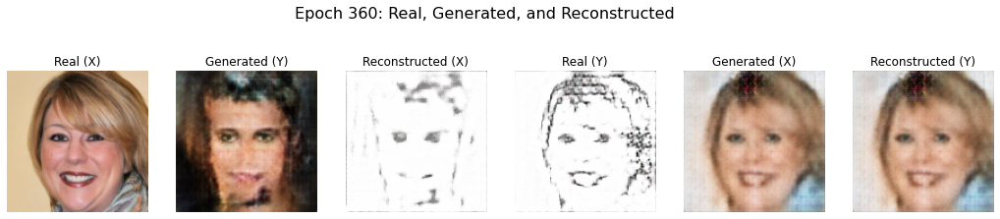

Checkpoint saved at epoch 360
Epoch [  361/ 1000] | d_X_loss: 0.3901 | d_Y_loss: 0.3593 | g_total_loss: 3.2750
Epoch [  362/ 1000] | d_X_loss: 0.4066 | d_Y_loss: 0.2866 | g_total_loss: 3.6130
Epoch [  363/ 1000] | d_X_loss: 0.4255 | d_Y_loss: 0.3476 | g_total_loss: 3.4895
Epoch [  364/ 1000] | d_X_loss: 0.4200 | d_Y_loss: 0.2748 | g_total_loss: 3.5935
Epoch [  365/ 1000] | d_X_loss: 0.4737 | d_Y_loss: 0.2840 | g_total_loss: 3.6434
Epoch [  366/ 1000] | d_X_loss: 0.4104 | d_Y_loss: 0.3324 | g_total_loss: 3.1191
Epoch [  367/ 1000] | d_X_loss: 0.4325 | d_Y_loss: 0.2754 | g_total_loss: 3.6087
Epoch [  368/ 1000] | d_X_loss: 0.3596 | d_Y_loss: 0.3130 | g_total_loss: 3.8086
Epoch [  369/ 1000] | d_X_loss: 0.4107 | d_Y_loss: 0.3109 | g_total_loss: 3.3156
Epoch [  370/ 1000] | d_X_loss: 0.4050 | d_Y_loss: 0.3544 | g_total_loss: 3.7801
Checkpoint saved at epoch 370
Epoch [  371/ 1000] | d_X_loss: 0.4147 | d_Y_loss: 0.3500 | g_total_loss: 3.4504
Epoch [  372/ 1000] | d_X_loss: 0.4267 | d_Y_loss

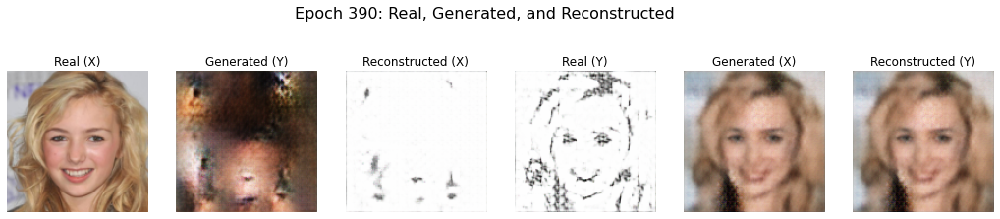

Checkpoint saved at epoch 390
Epoch [  391/ 1000] | d_X_loss: 0.4002 | d_Y_loss: 0.3620 | g_total_loss: 3.4370
Epoch [  392/ 1000] | d_X_loss: 0.3705 | d_Y_loss: 0.3543 | g_total_loss: 3.8488
Epoch [  393/ 1000] | d_X_loss: 0.3399 | d_Y_loss: 0.3873 | g_total_loss: 3.5459
Epoch [  394/ 1000] | d_X_loss: 0.3637 | d_Y_loss: 0.3479 | g_total_loss: 3.5317
Epoch [  395/ 1000] | d_X_loss: 0.4047 | d_Y_loss: 0.3025 | g_total_loss: 3.3900
Epoch [  396/ 1000] | d_X_loss: 0.3850 | d_Y_loss: 0.3266 | g_total_loss: 3.2609
Epoch [  397/ 1000] | d_X_loss: 0.3843 | d_Y_loss: 0.3510 | g_total_loss: 3.9417
Epoch [  398/ 1000] | d_X_loss: 0.4375 | d_Y_loss: 0.3035 | g_total_loss: 3.2967
Epoch [  399/ 1000] | d_X_loss: 0.4157 | d_Y_loss: 0.2530 | g_total_loss: 3.5931
Epoch [  400/ 1000] | d_X_loss: 0.4394 | d_Y_loss: 0.2785 | g_total_loss: 3.4330
Checkpoint saved at epoch 400
Epoch [  401/ 1000] | d_X_loss: 0.4507 | d_Y_loss: 0.2699 | g_total_loss: 3.4740
Epoch [  402/ 1000] | d_X_loss: 0.4326 | d_Y_loss

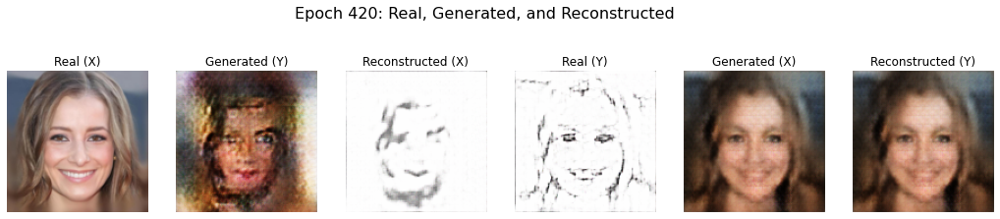

Checkpoint saved at epoch 420
Epoch [  421/ 1000] | d_X_loss: 0.4244 | d_Y_loss: 0.3322 | g_total_loss: 3.7772
Epoch [  422/ 1000] | d_X_loss: 0.4152 | d_Y_loss: 0.4030 | g_total_loss: 3.1526
Epoch [  423/ 1000] | d_X_loss: 0.3811 | d_Y_loss: 0.3513 | g_total_loss: 3.5012
Epoch [  424/ 1000] | d_X_loss: 0.3880 | d_Y_loss: 0.3630 | g_total_loss: 3.3704
Epoch [  425/ 1000] | d_X_loss: 0.3944 | d_Y_loss: 0.3169 | g_total_loss: 3.6568
Epoch [  426/ 1000] | d_X_loss: 0.3899 | d_Y_loss: 0.2676 | g_total_loss: 4.3137
Epoch [  427/ 1000] | d_X_loss: 0.3616 | d_Y_loss: 0.2665 | g_total_loss: 3.4801
Epoch [  428/ 1000] | d_X_loss: 0.3632 | d_Y_loss: 0.3053 | g_total_loss: 3.3666
Epoch [  429/ 1000] | d_X_loss: 0.3768 | d_Y_loss: 0.2986 | g_total_loss: 4.0149
Epoch [  430/ 1000] | d_X_loss: 0.3687 | d_Y_loss: 0.2996 | g_total_loss: 3.4266
Checkpoint saved at epoch 430
Epoch [  431/ 1000] | d_X_loss: 0.3685 | d_Y_loss: 0.3372 | g_total_loss: 3.5355
Epoch [  432/ 1000] | d_X_loss: 0.4066 | d_Y_loss

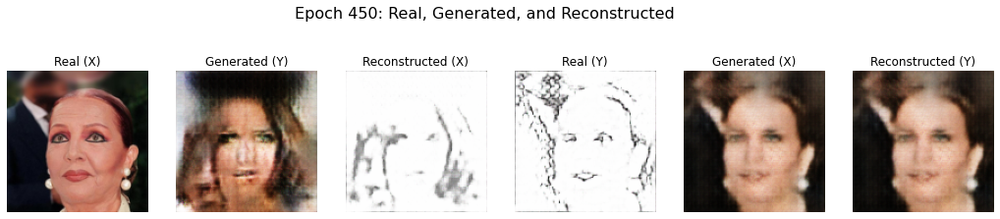

Checkpoint saved at epoch 450
Epoch [  451/ 1000] | d_X_loss: 0.3664 | d_Y_loss: 0.3149 | g_total_loss: 3.6810
Epoch [  452/ 1000] | d_X_loss: 0.3643 | d_Y_loss: 0.2987 | g_total_loss: 3.6125
Epoch [  453/ 1000] | d_X_loss: 0.3699 | d_Y_loss: 0.2788 | g_total_loss: 3.7316
Epoch [  454/ 1000] | d_X_loss: 0.3900 | d_Y_loss: 0.3190 | g_total_loss: 4.0319
Epoch [  455/ 1000] | d_X_loss: 0.4131 | d_Y_loss: 0.3627 | g_total_loss: 4.1326
Epoch [  456/ 1000] | d_X_loss: 0.3991 | d_Y_loss: 0.5088 | g_total_loss: 3.7472
Epoch [  457/ 1000] | d_X_loss: 0.4246 | d_Y_loss: 0.3887 | g_total_loss: 3.6425
Epoch [  458/ 1000] | d_X_loss: 0.3836 | d_Y_loss: 0.3684 | g_total_loss: 3.4673
Epoch [  459/ 1000] | d_X_loss: 0.3947 | d_Y_loss: 0.3469 | g_total_loss: 3.2506
Epoch [  460/ 1000] | d_X_loss: 0.4226 | d_Y_loss: 0.3861 | g_total_loss: 3.6724
Checkpoint saved at epoch 460
Epoch [  461/ 1000] | d_X_loss: 0.4004 | d_Y_loss: 0.3462 | g_total_loss: 3.4973
Epoch [  462/ 1000] | d_X_loss: 0.4127 | d_Y_loss

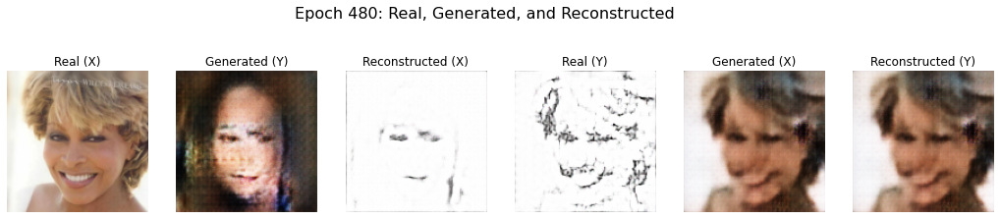

Checkpoint saved at epoch 480
Epoch [  481/ 1000] | d_X_loss: 0.4470 | d_Y_loss: 0.3105 | g_total_loss: 3.4193
Epoch [  482/ 1000] | d_X_loss: 0.4219 | d_Y_loss: 0.2861 | g_total_loss: 3.5044
Epoch [  483/ 1000] | d_X_loss: 0.4280 | d_Y_loss: 0.3204 | g_total_loss: 3.2902
Epoch [  484/ 1000] | d_X_loss: 0.4296 | d_Y_loss: 0.3710 | g_total_loss: 3.2314
Epoch [  485/ 1000] | d_X_loss: 0.4018 | d_Y_loss: 0.3492 | g_total_loss: 3.5883
Epoch [  486/ 1000] | d_X_loss: 0.3885 | d_Y_loss: 0.3582 | g_total_loss: 3.4156
Epoch [  487/ 1000] | d_X_loss: 0.3819 | d_Y_loss: 0.3277 | g_total_loss: 3.7139
Epoch [  488/ 1000] | d_X_loss: 0.3969 | d_Y_loss: 0.3551 | g_total_loss: 3.6756
Epoch [  489/ 1000] | d_X_loss: 0.4127 | d_Y_loss: 0.3762 | g_total_loss: 3.5505
Epoch [  490/ 1000] | d_X_loss: 0.3832 | d_Y_loss: 0.4398 | g_total_loss: 3.7920
Checkpoint saved at epoch 490
Epoch [  491/ 1000] | d_X_loss: 0.3537 | d_Y_loss: 0.3928 | g_total_loss: 3.7895
Epoch [  492/ 1000] | d_X_loss: 0.3649 | d_Y_loss

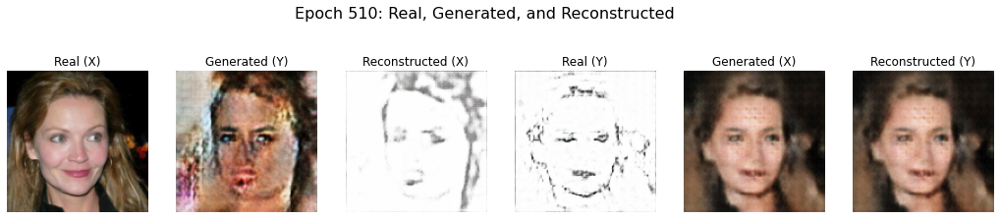

Checkpoint saved at epoch 510
Epoch [  511/ 1000] | d_X_loss: 0.4306 | d_Y_loss: 0.3053 | g_total_loss: 3.7273
Epoch [  512/ 1000] | d_X_loss: 0.3968 | d_Y_loss: 0.3667 | g_total_loss: 4.0656
Epoch [  513/ 1000] | d_X_loss: 0.3993 | d_Y_loss: 0.3494 | g_total_loss: 3.4945
Epoch [  514/ 1000] | d_X_loss: 0.3749 | d_Y_loss: 0.3621 | g_total_loss: 3.2357
Epoch [  515/ 1000] | d_X_loss: 0.3343 | d_Y_loss: 0.3096 | g_total_loss: 3.6603
Epoch [  516/ 1000] | d_X_loss: 0.3242 | d_Y_loss: 0.2571 | g_total_loss: 3.7522
Epoch [  517/ 1000] | d_X_loss: 0.3443 | d_Y_loss: 0.2717 | g_total_loss: 3.6555
Epoch [  518/ 1000] | d_X_loss: 0.3301 | d_Y_loss: 0.2887 | g_total_loss: 3.6439
Epoch [  519/ 1000] | d_X_loss: 0.3864 | d_Y_loss: 0.3451 | g_total_loss: 3.8056
Epoch [  520/ 1000] | d_X_loss: 0.3873 | d_Y_loss: 0.3234 | g_total_loss: 3.3142
Checkpoint saved at epoch 520
Epoch [  521/ 1000] | d_X_loss: 0.4242 | d_Y_loss: 0.3283 | g_total_loss: 3.4644
Epoch [  522/ 1000] | d_X_loss: 0.4592 | d_Y_loss

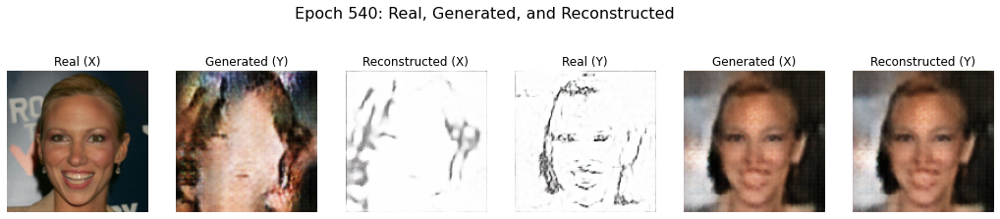

Checkpoint saved at epoch 540
Epoch [  541/ 1000] | d_X_loss: 0.4700 | d_Y_loss: 0.2618 | g_total_loss: 3.9853
Epoch [  542/ 1000] | d_X_loss: 0.4134 | d_Y_loss: 0.3273 | g_total_loss: 3.2897
Epoch [  543/ 1000] | d_X_loss: 0.3977 | d_Y_loss: 0.3043 | g_total_loss: 3.7613
Epoch [  544/ 1000] | d_X_loss: 0.4007 | d_Y_loss: 0.2742 | g_total_loss: 3.4271
Epoch [  545/ 1000] | d_X_loss: 0.4649 | d_Y_loss: 0.2884 | g_total_loss: 3.8731
Epoch [  546/ 1000] | d_X_loss: 0.4912 | d_Y_loss: 0.3016 | g_total_loss: 3.5882
Epoch [  547/ 1000] | d_X_loss: 0.4673 | d_Y_loss: 0.3246 | g_total_loss: 3.6850
Epoch [  548/ 1000] | d_X_loss: 0.4766 | d_Y_loss: 0.3348 | g_total_loss: 3.4230
Epoch [  549/ 1000] | d_X_loss: 0.4127 | d_Y_loss: 0.3940 | g_total_loss: 3.4005
Epoch [  550/ 1000] | d_X_loss: 0.3890 | d_Y_loss: 0.3744 | g_total_loss: 3.0181
Checkpoint saved at epoch 550
Epoch [  551/ 1000] | d_X_loss: 0.3471 | d_Y_loss: 0.4549 | g_total_loss: 4.5846
Epoch [  552/ 1000] | d_X_loss: 0.3439 | d_Y_loss

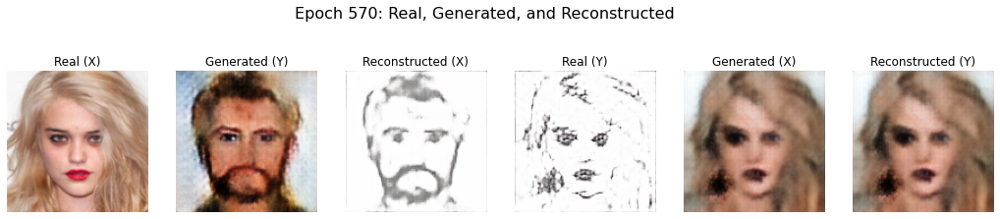

Checkpoint saved at epoch 570
Epoch [  571/ 1000] | d_X_loss: 0.3808 | d_Y_loss: 0.2571 | g_total_loss: 3.4007
Epoch [  572/ 1000] | d_X_loss: 0.3794 | d_Y_loss: 0.2864 | g_total_loss: 3.6007
Epoch [  573/ 1000] | d_X_loss: 0.3804 | d_Y_loss: 0.2766 | g_total_loss: 3.2399
Epoch [  574/ 1000] | d_X_loss: 0.3823 | d_Y_loss: 0.2890 | g_total_loss: 3.5794
Epoch [  575/ 1000] | d_X_loss: 0.4052 | d_Y_loss: 0.2717 | g_total_loss: 3.4252
Epoch [  576/ 1000] | d_X_loss: 0.3617 | d_Y_loss: 0.3462 | g_total_loss: 3.7804
Epoch [  577/ 1000] | d_X_loss: 0.3845 | d_Y_loss: 0.3758 | g_total_loss: 3.3186
Epoch [  578/ 1000] | d_X_loss: 0.3681 | d_Y_loss: 0.3937 | g_total_loss: 3.4581
Epoch [  579/ 1000] | d_X_loss: 0.3726 | d_Y_loss: 0.4431 | g_total_loss: 3.6011
Epoch [  580/ 1000] | d_X_loss: 0.3584 | d_Y_loss: 0.4053 | g_total_loss: 3.8659
Checkpoint saved at epoch 580
Epoch [  581/ 1000] | d_X_loss: 0.3677 | d_Y_loss: 0.3398 | g_total_loss: 3.2731
Epoch [  582/ 1000] | d_X_loss: 0.3562 | d_Y_loss

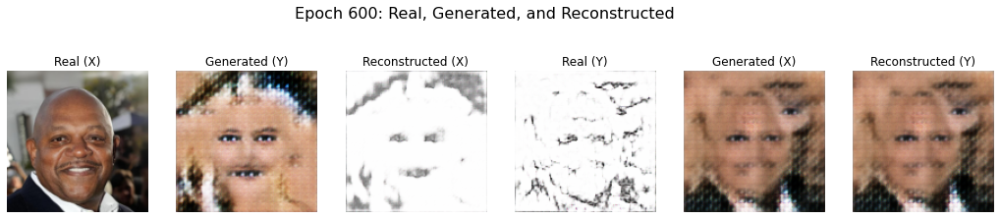

Checkpoint saved at epoch 600
Epoch [  601/ 1000] | d_X_loss: 3.8267 | d_Y_loss: 0.2372 | g_total_loss: 4.3932
Epoch [  602/ 1000] | d_X_loss: 1.0292 | d_Y_loss: 0.2068 | g_total_loss: 4.1149
Epoch [  603/ 1000] | d_X_loss: 0.7691 | d_Y_loss: 0.2821 | g_total_loss: 3.9507
Epoch [  604/ 1000] | d_X_loss: 0.5407 | d_Y_loss: 0.2673 | g_total_loss: 3.7588
Epoch [  605/ 1000] | d_X_loss: 0.5454 | d_Y_loss: 0.2475 | g_total_loss: 3.6541
Epoch [  606/ 1000] | d_X_loss: 0.5428 | d_Y_loss: 0.2840 | g_total_loss: 3.9130
Epoch [  607/ 1000] | d_X_loss: 0.5001 | d_Y_loss: 0.5051 | g_total_loss: 3.2955
Epoch [  608/ 1000] | d_X_loss: 0.5040 | d_Y_loss: 0.3027 | g_total_loss: 3.2738
Epoch [  609/ 1000] | d_X_loss: 0.4947 | d_Y_loss: 0.2713 | g_total_loss: 3.7616
Epoch [  610/ 1000] | d_X_loss: 0.4950 | d_Y_loss: 0.2394 | g_total_loss: 3.7431
Checkpoint saved at epoch 610
Epoch [  611/ 1000] | d_X_loss: 0.5027 | d_Y_loss: 0.2529 | g_total_loss: 3.1824
Epoch [  612/ 1000] | d_X_loss: 0.4913 | d_Y_loss

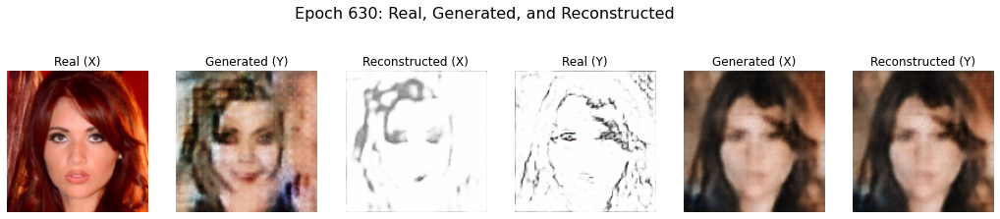

Checkpoint saved at epoch 630
Epoch [  631/ 1000] | d_X_loss: 0.5073 | d_Y_loss: 0.3637 | g_total_loss: 3.3661
Epoch [  632/ 1000] | d_X_loss: 0.5020 | d_Y_loss: 0.3221 | g_total_loss: 3.2290
Epoch [  633/ 1000] | d_X_loss: 0.5119 | d_Y_loss: 0.3600 | g_total_loss: 3.7664
Epoch [  634/ 1000] | d_X_loss: 0.5100 | d_Y_loss: 0.3678 | g_total_loss: 3.2753
Epoch [  635/ 1000] | d_X_loss: 0.5053 | d_Y_loss: 0.3436 | g_total_loss: 3.4267
Epoch [  636/ 1000] | d_X_loss: 0.5103 | d_Y_loss: 0.3092 | g_total_loss: 3.4390
Epoch [  637/ 1000] | d_X_loss: 0.5091 | d_Y_loss: 0.2895 | g_total_loss: 3.1759
Epoch [  638/ 1000] | d_X_loss: 0.5017 | d_Y_loss: 0.2911 | g_total_loss: 3.3514
Epoch [  639/ 1000] | d_X_loss: 0.4998 | d_Y_loss: 0.3237 | g_total_loss: 3.3028
Epoch [  640/ 1000] | d_X_loss: 0.5062 | d_Y_loss: 0.2950 | g_total_loss: 3.3915
Checkpoint saved at epoch 640
Epoch [  641/ 1000] | d_X_loss: 0.4931 | d_Y_loss: 0.2816 | g_total_loss: 3.3203
Epoch [  642/ 1000] | d_X_loss: 0.4906 | d_Y_loss

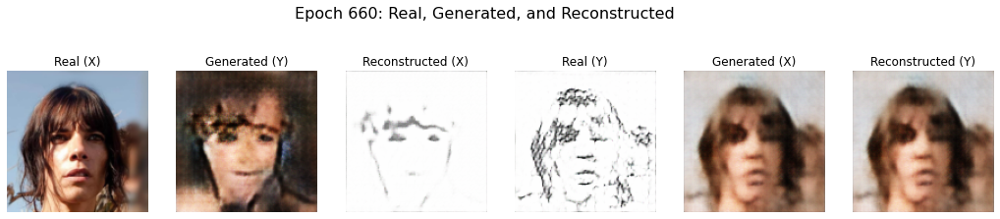

Checkpoint saved at epoch 660
Epoch [  661/ 1000] | d_X_loss: 0.4889 | d_Y_loss: 0.3321 | g_total_loss: 3.1423
Epoch [  662/ 1000] | d_X_loss: 0.4926 | d_Y_loss: 0.3467 | g_total_loss: 2.7313
Epoch [  663/ 1000] | d_X_loss: 0.4915 | d_Y_loss: 0.3406 | g_total_loss: 3.4197
Epoch [  664/ 1000] | d_X_loss: 0.4973 | d_Y_loss: 0.3153 | g_total_loss: 2.9351
Epoch [  665/ 1000] | d_X_loss: 0.4964 | d_Y_loss: 0.3637 | g_total_loss: 2.9519
Epoch [  666/ 1000] | d_X_loss: 0.5045 | d_Y_loss: 0.3864 | g_total_loss: 2.9694
Epoch [  667/ 1000] | d_X_loss: 0.4913 | d_Y_loss: 0.3820 | g_total_loss: 3.0765
Epoch [  668/ 1000] | d_X_loss: 0.4929 | d_Y_loss: 0.3170 | g_total_loss: 3.2864
Epoch [  669/ 1000] | d_X_loss: 0.4993 | d_Y_loss: 0.3211 | g_total_loss: 3.1844
Epoch [  670/ 1000] | d_X_loss: 0.4911 | d_Y_loss: 0.2970 | g_total_loss: 3.3407
Checkpoint saved at epoch 670
Epoch [  671/ 1000] | d_X_loss: 0.4966 | d_Y_loss: 0.2915 | g_total_loss: 3.4149
Epoch [  672/ 1000] | d_X_loss: 0.4969 | d_Y_loss

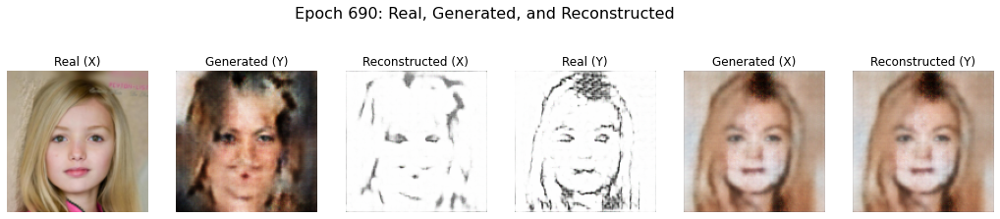

Checkpoint saved at epoch 690
Epoch [  691/ 1000] | d_X_loss: 0.4920 | d_Y_loss: 0.3089 | g_total_loss: 3.0765
Epoch [  692/ 1000] | d_X_loss: 0.4987 | d_Y_loss: 0.2984 | g_total_loss: 3.6622
Epoch [  693/ 1000] | d_X_loss: 0.5007 | d_Y_loss: 0.2913 | g_total_loss: 3.3384
Epoch [  694/ 1000] | d_X_loss: 0.4940 | d_Y_loss: 0.3441 | g_total_loss: 3.1035
Epoch [  695/ 1000] | d_X_loss: 0.4982 | d_Y_loss: 0.3038 | g_total_loss: 3.2408
Epoch [  696/ 1000] | d_X_loss: 0.4898 | d_Y_loss: 0.2811 | g_total_loss: 3.3357
Epoch [  697/ 1000] | d_X_loss: 0.4945 | d_Y_loss: 0.3875 | g_total_loss: 3.0707
Epoch [  698/ 1000] | d_X_loss: 0.5020 | d_Y_loss: 0.3432 | g_total_loss: 3.0121
Epoch [  699/ 1000] | d_X_loss: 0.4968 | d_Y_loss: 0.3698 | g_total_loss: 3.3896
Epoch [  700/ 1000] | d_X_loss: 0.5050 | d_Y_loss: 0.3674 | g_total_loss: 3.0545
Checkpoint saved at epoch 700
Epoch [  701/ 1000] | d_X_loss: 0.4904 | d_Y_loss: 0.3784 | g_total_loss: 3.1768
Epoch [  702/ 1000] | d_X_loss: 0.4889 | d_Y_loss

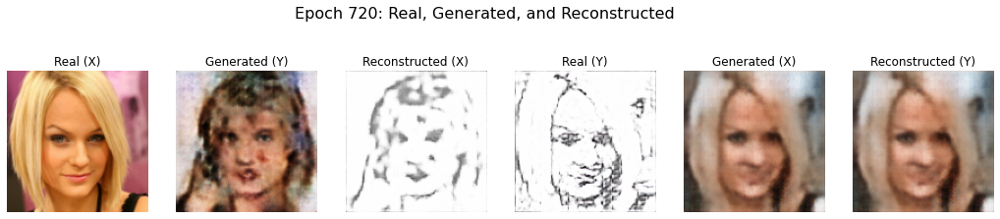

Checkpoint saved at epoch 720
Epoch [  721/ 1000] | d_X_loss: 0.4854 | d_Y_loss: 0.3380 | g_total_loss: 3.0908
Epoch [  722/ 1000] | d_X_loss: 0.4868 | d_Y_loss: 0.3004 | g_total_loss: 3.3133
Epoch [  723/ 1000] | d_X_loss: 0.4978 | d_Y_loss: 0.2842 | g_total_loss: 3.6698
Epoch [  724/ 1000] | d_X_loss: 0.4962 | d_Y_loss: 0.3274 | g_total_loss: 3.1402
Epoch [  725/ 1000] | d_X_loss: 0.4785 | d_Y_loss: 0.3366 | g_total_loss: 3.5482
Epoch [  726/ 1000] | d_X_loss: 0.4926 | d_Y_loss: 0.3864 | g_total_loss: 3.4070
Epoch [  727/ 1000] | d_X_loss: 0.4891 | d_Y_loss: 0.3285 | g_total_loss: 3.3385
Epoch [  728/ 1000] | d_X_loss: 0.4856 | d_Y_loss: 0.3174 | g_total_loss: 3.5093
Epoch [  729/ 1000] | d_X_loss: 0.4934 | d_Y_loss: 0.3663 | g_total_loss: 3.3658
Epoch [  730/ 1000] | d_X_loss: 0.4906 | d_Y_loss: 0.3259 | g_total_loss: 3.3855
Checkpoint saved at epoch 730
Epoch [  731/ 1000] | d_X_loss: 0.4741 | d_Y_loss: 0.4354 | g_total_loss: 2.8702
Epoch [  732/ 1000] | d_X_loss: 0.4956 | d_Y_loss

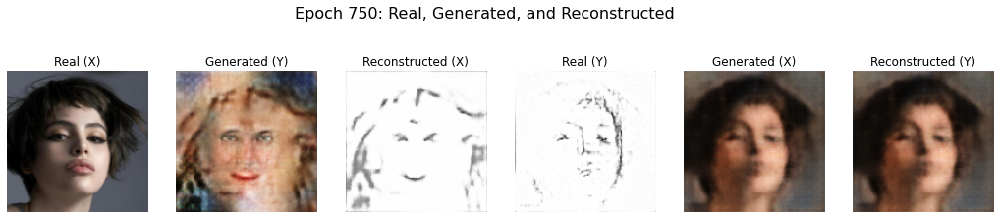

Checkpoint saved at epoch 750
Epoch [  751/ 1000] | d_X_loss: 0.4725 | d_Y_loss: 0.3747 | g_total_loss: 3.1787
Epoch [  752/ 1000] | d_X_loss: 0.4885 | d_Y_loss: 0.3697 | g_total_loss: 3.6561
Epoch [  753/ 1000] | d_X_loss: 0.4833 | d_Y_loss: 0.4149 | g_total_loss: 3.5187
Epoch [  754/ 1000] | d_X_loss: 0.4861 | d_Y_loss: 0.3556 | g_total_loss: 3.1070
Epoch [  755/ 1000] | d_X_loss: 0.4715 | d_Y_loss: 0.3132 | g_total_loss: 3.1405
Epoch [  756/ 1000] | d_X_loss: 0.4825 | d_Y_loss: 0.2940 | g_total_loss: 2.7630
Epoch [  757/ 1000] | d_X_loss: 0.4913 | d_Y_loss: 0.3712 | g_total_loss: 3.4259
Epoch [  758/ 1000] | d_X_loss: 0.4952 | d_Y_loss: 0.3406 | g_total_loss: 3.0589
Epoch [  759/ 1000] | d_X_loss: 0.4904 | d_Y_loss: 0.3560 | g_total_loss: 3.3250
Epoch [  760/ 1000] | d_X_loss: 0.4914 | d_Y_loss: 0.3307 | g_total_loss: 3.6045
Checkpoint saved at epoch 760
Epoch [  761/ 1000] | d_X_loss: 0.4980 | d_Y_loss: 0.3154 | g_total_loss: 3.3130
Epoch [  762/ 1000] | d_X_loss: 0.4889 | d_Y_loss

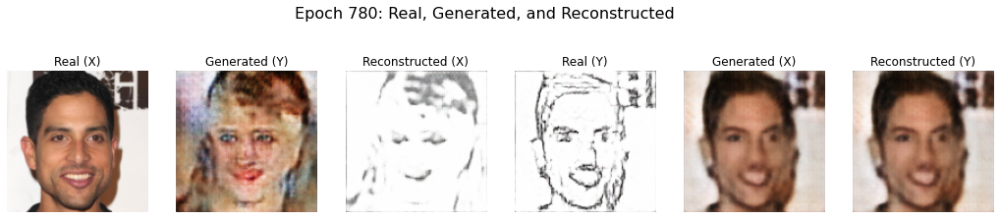

Checkpoint saved at epoch 780
Epoch [  781/ 1000] | d_X_loss: 0.4796 | d_Y_loss: 0.2999 | g_total_loss: 3.5092
Epoch [  782/ 1000] | d_X_loss: 0.4789 | d_Y_loss: 0.2843 | g_total_loss: 3.1992
Epoch [  783/ 1000] | d_X_loss: 0.4733 | d_Y_loss: 0.3003 | g_total_loss: 3.5829
Epoch [  784/ 1000] | d_X_loss: 0.4737 | d_Y_loss: 0.3211 | g_total_loss: 3.3090
Epoch [  785/ 1000] | d_X_loss: 0.4742 | d_Y_loss: 0.3040 | g_total_loss: 2.8920
Epoch [  786/ 1000] | d_X_loss: 0.4719 | d_Y_loss: 0.3203 | g_total_loss: 3.4536
Epoch [  787/ 1000] | d_X_loss: 0.5011 | d_Y_loss: 0.3877 | g_total_loss: 2.9829
Epoch [  788/ 1000] | d_X_loss: 0.4733 | d_Y_loss: 0.4212 | g_total_loss: 3.3647
Epoch [  789/ 1000] | d_X_loss: 0.4783 | d_Y_loss: 0.4723 | g_total_loss: 3.2434
Epoch [  790/ 1000] | d_X_loss: 0.4851 | d_Y_loss: 0.3623 | g_total_loss: 3.3416
Checkpoint saved at epoch 790
Epoch [  791/ 1000] | d_X_loss: 0.4958 | d_Y_loss: 0.4008 | g_total_loss: 3.4119
Epoch [  792/ 1000] | d_X_loss: 0.4875 | d_Y_loss

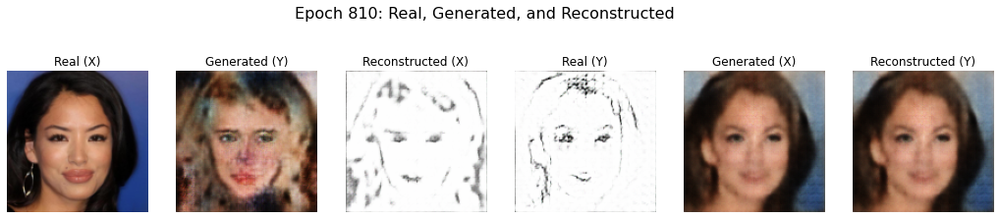

Checkpoint saved at epoch 810
Epoch [  811/ 1000] | d_X_loss: 0.4763 | d_Y_loss: 0.3021 | g_total_loss: 3.4758
Epoch [  812/ 1000] | d_X_loss: 0.4720 | d_Y_loss: 0.3150 | g_total_loss: 3.0646
Epoch [  813/ 1000] | d_X_loss: 0.4697 | d_Y_loss: 0.3964 | g_total_loss: 3.2388
Epoch [  814/ 1000] | d_X_loss: 0.4751 | d_Y_loss: 0.2770 | g_total_loss: 3.2863
Epoch [  815/ 1000] | d_X_loss: 0.4722 | d_Y_loss: 0.2825 | g_total_loss: 3.1167
Epoch [  816/ 1000] | d_X_loss: 0.4619 | d_Y_loss: 0.3176 | g_total_loss: 3.5547
Epoch [  817/ 1000] | d_X_loss: 0.4649 | d_Y_loss: 0.4147 | g_total_loss: 3.1452
Epoch [  818/ 1000] | d_X_loss: 0.4586 | d_Y_loss: 0.4973 | g_total_loss: 3.5846
Epoch [  819/ 1000] | d_X_loss: 0.4602 | d_Y_loss: 0.4140 | g_total_loss: 3.3281
Epoch [  820/ 1000] | d_X_loss: 0.4509 | d_Y_loss: 0.3749 | g_total_loss: 3.4885
Checkpoint saved at epoch 820
Epoch [  821/ 1000] | d_X_loss: 0.4498 | d_Y_loss: 0.4479 | g_total_loss: 3.0929
Epoch [  822/ 1000] | d_X_loss: 0.4547 | d_Y_loss

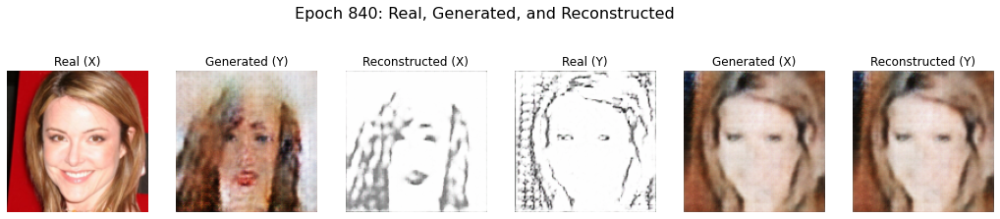

Checkpoint saved at epoch 840
Epoch [  841/ 1000] | d_X_loss: 0.4436 | d_Y_loss: 0.3006 | g_total_loss: 3.8060
Epoch [  842/ 1000] | d_X_loss: 0.4553 | d_Y_loss: 0.3453 | g_total_loss: 3.2933
Epoch [  843/ 1000] | d_X_loss: 0.4495 | d_Y_loss: 0.3220 | g_total_loss: 3.6305
Epoch [  844/ 1000] | d_X_loss: 0.4489 | d_Y_loss: 0.2849 | g_total_loss: 3.5758
Epoch [  845/ 1000] | d_X_loss: 0.4608 | d_Y_loss: 0.2716 | g_total_loss: 3.1085
Epoch [  846/ 1000] | d_X_loss: 0.4705 | d_Y_loss: 0.3040 | g_total_loss: 3.1697
Epoch [  847/ 1000] | d_X_loss: 0.4651 | d_Y_loss: 0.3316 | g_total_loss: 3.0713
Epoch [  848/ 1000] | d_X_loss: 0.4528 | d_Y_loss: 0.3509 | g_total_loss: 3.5986
Epoch [  849/ 1000] | d_X_loss: 0.4497 | d_Y_loss: 0.4559 | g_total_loss: 3.2058
Epoch [  850/ 1000] | d_X_loss: 0.4625 | d_Y_loss: 0.3563 | g_total_loss: 3.2982
Checkpoint saved at epoch 850
Epoch [  851/ 1000] | d_X_loss: 0.4931 | d_Y_loss: 0.3570 | g_total_loss: 3.0817
Epoch [  852/ 1000] | d_X_loss: 0.4894 | d_Y_loss

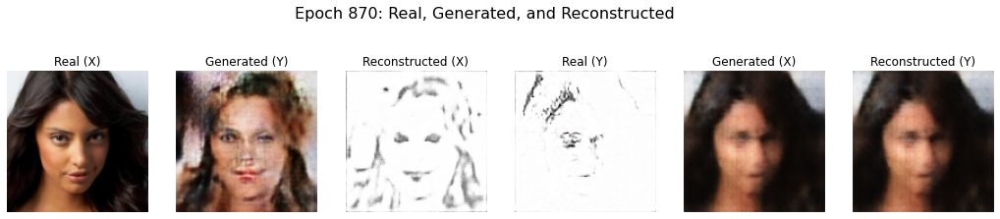

Checkpoint saved at epoch 870
Epoch [  871/ 1000] | d_X_loss: 0.4673 | d_Y_loss: 0.3214 | g_total_loss: 3.5129
Epoch [  872/ 1000] | d_X_loss: 0.4585 | d_Y_loss: 0.3099 | g_total_loss: 3.2958
Epoch [  873/ 1000] | d_X_loss: 0.4594 | d_Y_loss: 0.3122 | g_total_loss: 3.3538
Epoch [  874/ 1000] | d_X_loss: 0.4529 | d_Y_loss: 0.3317 | g_total_loss: 3.4466
Epoch [  875/ 1000] | d_X_loss: 0.4716 | d_Y_loss: 0.3170 | g_total_loss: 3.0013
Epoch [  876/ 1000] | d_X_loss: 0.4521 | d_Y_loss: 0.2728 | g_total_loss: 3.1331
Epoch [  877/ 1000] | d_X_loss: 0.4378 | d_Y_loss: 0.3392 | g_total_loss: 3.5423
Epoch [  878/ 1000] | d_X_loss: 0.4275 | d_Y_loss: 0.3291 | g_total_loss: 3.6563
Epoch [  879/ 1000] | d_X_loss: 0.4563 | d_Y_loss: 0.3224 | g_total_loss: 3.2918
Epoch [  880/ 1000] | d_X_loss: 0.4590 | d_Y_loss: 0.2614 | g_total_loss: 3.5057
Checkpoint saved at epoch 880
Epoch [  881/ 1000] | d_X_loss: 0.4419 | d_Y_loss: 0.2750 | g_total_loss: 3.0035
Epoch [  882/ 1000] | d_X_loss: 0.4606 | d_Y_loss

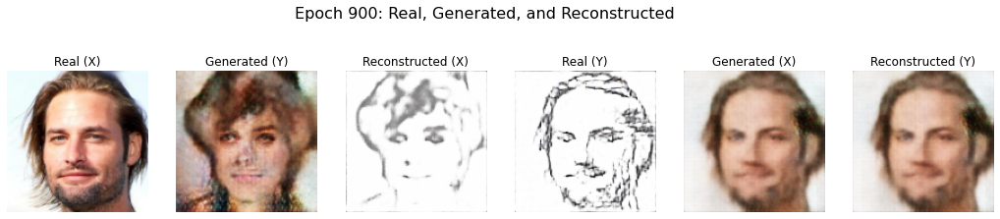

Checkpoint saved at epoch 900
Epoch [  901/ 1000] | d_X_loss: 0.4415 | d_Y_loss: 0.2973 | g_total_loss: 3.3507
Epoch [  902/ 1000] | d_X_loss: 0.4406 | d_Y_loss: 0.3667 | g_total_loss: 2.9847
Epoch [  903/ 1000] | d_X_loss: 0.4384 | d_Y_loss: 0.4200 | g_total_loss: 3.2215
Epoch [  904/ 1000] | d_X_loss: 0.4670 | d_Y_loss: 0.3580 | g_total_loss: 3.2885
Epoch [  905/ 1000] | d_X_loss: 0.4599 | d_Y_loss: 0.3349 | g_total_loss: 3.5575
Epoch [  906/ 1000] | d_X_loss: 0.4596 | d_Y_loss: 0.3512 | g_total_loss: 3.4035
Epoch [  907/ 1000] | d_X_loss: 0.4466 | d_Y_loss: 0.3043 | g_total_loss: 3.4578
Epoch [  908/ 1000] | d_X_loss: 0.4159 | d_Y_loss: 0.2951 | g_total_loss: 3.5018
Epoch [  909/ 1000] | d_X_loss: 0.4545 | d_Y_loss: 0.2343 | g_total_loss: 3.7004
Epoch [  910/ 1000] | d_X_loss: 0.4494 | d_Y_loss: 0.2924 | g_total_loss: 3.1595
Checkpoint saved at epoch 910
Epoch [  911/ 1000] | d_X_loss: 0.4534 | d_Y_loss: 0.2431 | g_total_loss: 3.2976
Epoch [  912/ 1000] | d_X_loss: 0.4485 | d_Y_loss

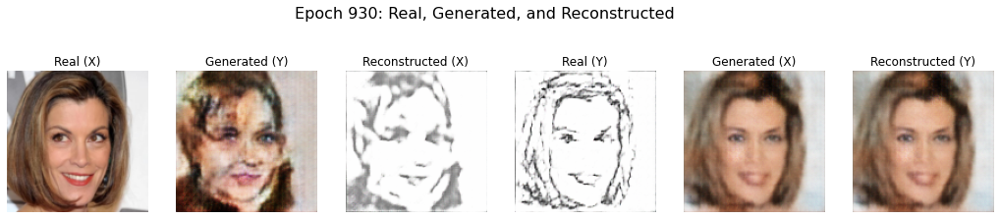

Checkpoint saved at epoch 930
Epoch [  931/ 1000] | d_X_loss: 0.4970 | d_Y_loss: 0.2746 | g_total_loss: 3.3089
Epoch [  932/ 1000] | d_X_loss: 0.4646 | d_Y_loss: 0.2891 | g_total_loss: 3.4658
Epoch [  933/ 1000] | d_X_loss: 0.4483 | d_Y_loss: 0.3283 | g_total_loss: 3.0950
Epoch [  934/ 1000] | d_X_loss: 0.4599 | d_Y_loss: 0.3384 | g_total_loss: 3.4798
Epoch [  935/ 1000] | d_X_loss: 0.4539 | d_Y_loss: 0.2832 | g_total_loss: 3.0772
Epoch [  936/ 1000] | d_X_loss: 0.4416 | d_Y_loss: 0.3331 | g_total_loss: 3.3067
Epoch [  937/ 1000] | d_X_loss: 0.4384 | d_Y_loss: 0.3148 | g_total_loss: 3.7848
Epoch [  938/ 1000] | d_X_loss: 0.4287 | d_Y_loss: 0.2776 | g_total_loss: 3.3128
Epoch [  939/ 1000] | d_X_loss: 0.4419 | d_Y_loss: 0.2769 | g_total_loss: 3.1599
Epoch [  940/ 1000] | d_X_loss: 0.4577 | d_Y_loss: 0.2936 | g_total_loss: 3.5890
Checkpoint saved at epoch 940
Epoch [  941/ 1000] | d_X_loss: 0.4433 | d_Y_loss: 0.3289 | g_total_loss: 3.0211
Epoch [  942/ 1000] | d_X_loss: 0.4237 | d_Y_loss

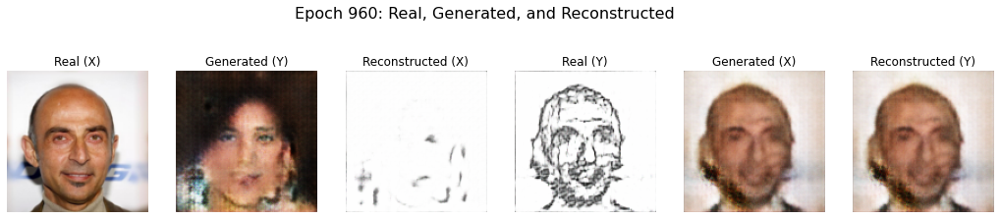

Checkpoint saved at epoch 960
Epoch [  961/ 1000] | d_X_loss: 0.4470 | d_Y_loss: 0.3269 | g_total_loss: 3.6162
Epoch [  962/ 1000] | d_X_loss: 0.4153 | d_Y_loss: 0.4193 | g_total_loss: 3.2847
Epoch [  963/ 1000] | d_X_loss: 0.4173 | d_Y_loss: 0.3447 | g_total_loss: 3.1715
Epoch [  964/ 1000] | d_X_loss: 0.4273 | d_Y_loss: 0.2772 | g_total_loss: 3.2892
Epoch [  965/ 1000] | d_X_loss: 0.4370 | d_Y_loss: 0.2939 | g_total_loss: 3.1528
Epoch [  966/ 1000] | d_X_loss: 0.4668 | d_Y_loss: 0.2937 | g_total_loss: 3.7027
Epoch [  967/ 1000] | d_X_loss: 0.4530 | d_Y_loss: 0.3218 | g_total_loss: 3.5144
Epoch [  968/ 1000] | d_X_loss: 0.4810 | d_Y_loss: 0.3502 | g_total_loss: 3.6554
Epoch [  969/ 1000] | d_X_loss: 0.4431 | d_Y_loss: 0.3036 | g_total_loss: 3.5543
Epoch [  970/ 1000] | d_X_loss: 0.4347 | d_Y_loss: 0.3228 | g_total_loss: 3.2915
Checkpoint saved at epoch 970
Epoch [  971/ 1000] | d_X_loss: 0.3941 | d_Y_loss: 0.3265 | g_total_loss: 3.6941
Epoch [  972/ 1000] | d_X_loss: 0.4086 | d_Y_loss

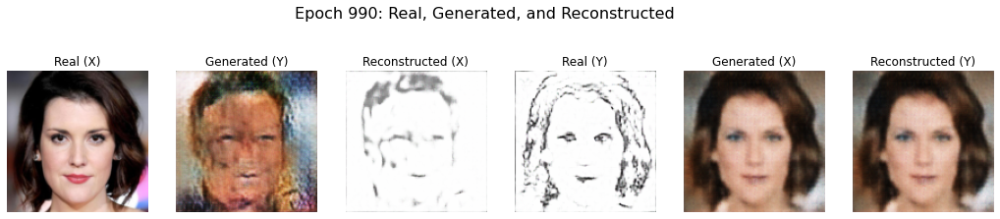

Checkpoint saved at epoch 990
Epoch [  991/ 1000] | d_X_loss: 0.4504 | d_Y_loss: 0.4835 | g_total_loss: 3.4804
Epoch [  992/ 1000] | d_X_loss: 0.4295 | d_Y_loss: 0.4450 | g_total_loss: 3.0205
Epoch [  993/ 1000] | d_X_loss: 0.4250 | d_Y_loss: 0.4675 | g_total_loss: 3.1968
Epoch [  994/ 1000] | d_X_loss: 0.4366 | d_Y_loss: 0.4453 | g_total_loss: 2.8897
Epoch [  995/ 1000] | d_X_loss: 0.4246 | d_Y_loss: 0.4727 | g_total_loss: 2.8781
Epoch [  996/ 1000] | d_X_loss: 0.4595 | d_Y_loss: 0.4361 | g_total_loss: 3.1549
Epoch [  997/ 1000] | d_X_loss: 0.4647 | d_Y_loss: 0.4197 | g_total_loss: 3.0377
Epoch [  998/ 1000] | d_X_loss: 0.4325 | d_Y_loss: 0.3960 | g_total_loss: 2.8546
Epoch [  999/ 1000] | d_X_loss: 0.4380 | d_Y_loss: 0.3993 | g_total_loss: 2.9019
Epoch [ 1000/ 1000] | d_X_loss: 0.4520 | d_Y_loss: 0.3479 | g_total_loss: 3.1881
Checkpoint saved at epoch 1000


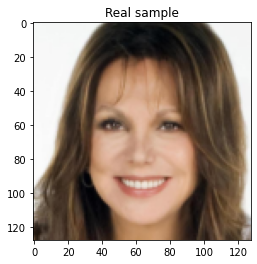

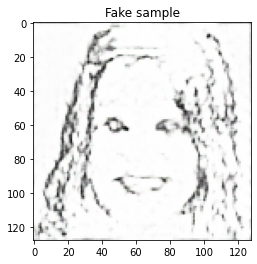

In [32]:
n_epochs = 1000 # keep this small when testing if a model first works, then increase it to >=1000

losses = training_loop(X_dataloader, Y_dataloader, X_dataloader, Y_dataloader, n_epochs=n_epochs)

# Conversion Visualization

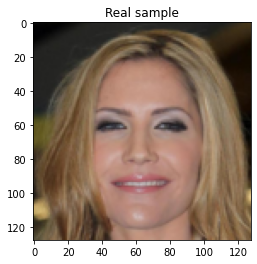

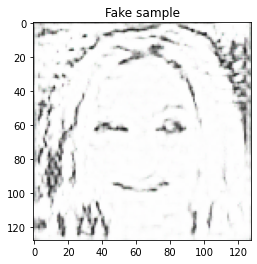

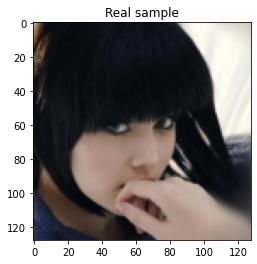

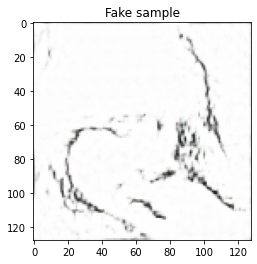

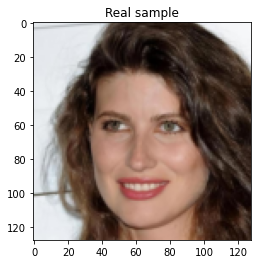

...

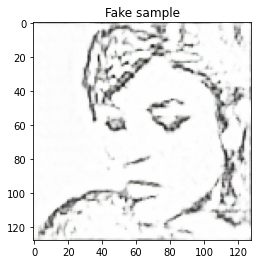

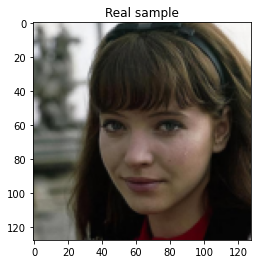

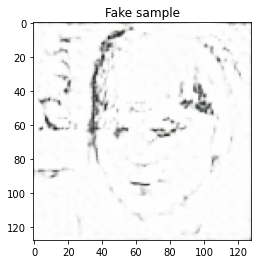

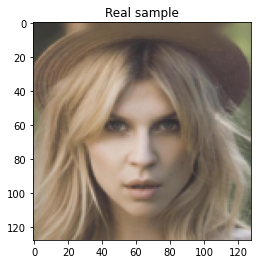

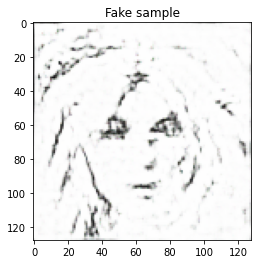

In [33]:
test_iter_X = iter(X_dataloader)
test_iter_Y = iter(Y_dataloader)

# Get some fixed data from domains X and Y for sampling. These are images that are held
# constant throughout training, that allow us to inspect the model's performance.
fixed_X = test_iter_X.next()
fixed_Y = test_iter_Y.next()
fixed_X = rescale(fixed_X) # make sure to scale to a range -1 to 1
fixed_Y = rescale(fixed_Y)
for fix_x , fix_y in zip(fixed_X , fixed_Y):
    save_samples(0, fix_y, fix_x, G_Y2X, G_X2Y, batch_size=1)

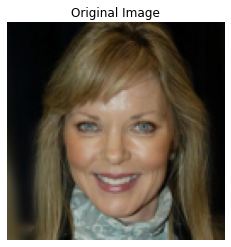

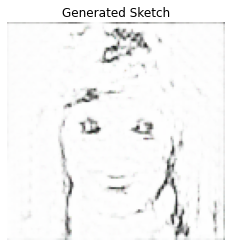

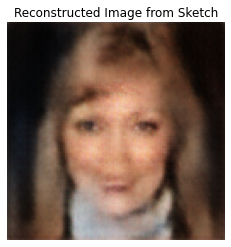

In [34]:
import torch
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt

# Set up transformations
transform = transforms.Compose([
    transforms.Resize(128),          # Resize to the same size used in training
    transforms.CenterCrop(128),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))  # Normalize to [-1, 1] range
])

def load_image(image_path):
    """Loads an image and applies transformations."""
    image = Image.open(image_path).convert('RGB')
    return transform(image).unsqueeze(0)  # Add batch dimension

def save_image(tensor, path):
    """Converts tensor to an image and saves it."""
    image = tensor.cpu().detach().squeeze(0)  # Remove batch dimension
    image = (image * 0.5 + 0.5).clamp(0, 1)  # Rescale from [-1,1] to [0,1]
    image = transforms.ToPILImage()(image)
    image.save(path)

def visualize_image(tensor, title):
    """Visualize a single image from a tensor."""
    image = tensor.cpu().detach().squeeze(0)  # Remove batch dimension
    image = (image * 0.5 + 0.5).clamp(0, 1)  # Rescale from [-1,1] to [0,1]
    image = transforms.ToPILImage()(image)
    plt.imshow(image)
    plt.title(title)
    plt.axis('off')
    plt.show()

# Load the models
device = 'cuda' if torch.cuda.is_available() else 'cpu'
G_X2Y = CycleGenerator(conv_dim=64, n_resblocks=9, padding_mode='reflect').to(device)
G_Y2X = CycleGenerator(conv_dim=64, n_resblocks=9, padding_mode='reflect').to(device)

# Load model weights
# Load model weights with correct filenames
G_X2Y.load_state_dict(torch.load('/kaggle/working/G_X2Y.pth', map_location=device))
G_Y2X.load_state_dict(torch.load('/kaggle/working/Y2X.pth', map_location=device))

G_X2Y.eval()
G_Y2X.eval()

# Load input image
image_path = '/kaggle/input/person-face-sketches/test/photos/10132.jpg'  # Replace with your test image path
image_tensor = load_image(image_path).to(device)

# Convert image to sketch
with torch.no_grad():
    sketch_tensor = G_X2Y(image_tensor)
    converted_image_tensor = G_Y2X(sketch_tensor)

# Visualize results
visualize_image(image_tensor, "Original Image")
visualize_image(sketch_tensor, "Generated Sketch")
visualize_image(converted_image_tensor, "Reconstructed Image from Sketch")

# Save results if needed
save_image(sketch_tensor, 'output_sketch.jpg')
save_image(converted_image_tensor, 'reconstructed_image.jpg')


## Submission data generator

In [ ]:
X_set = GANdataGenerator(data_dir='/kaggle/input/person-face-sketches/test/photos', data_files=photo_jpg, image_size=128)


X_dataloader = DataLoader(X_set , batch_size=1 , shuffle=True , num_workers=0)

## Generate Submission File

In [ ]:
import matplotlib.pyplot as plt

# Iterate through the data loader
for fix_x in X_dataloader:
    if fix_x is None:
        continue  # Skip if the image failed to load

    # Set the device
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    
    # Generate the fake image
    fake_Y = G_X2Y(fix_x.to(device))
    
    # Convert the tensor to an image format
    prediction = to_data(fake_Y)
    im = Image.fromarray(prediction)
    
    # Display the image using matplotlib
    plt.figure()
    plt.imshow(im)
    plt.axis('off')  # Hide axes for a cleaner display
    plt.show()


In [ ]:
torch.save(G_X2Y.state_dict(),"generator.pth")